<a href="https://colab.research.google.com/github/MarwaFA21/MSIB_Assessment/blob/main/Assessment_3_%5BMarwa_Fadlila_Amalia%5D.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Data terdiri dari data natural disaster dan economic damage yang diambil dari link berikut ini.


*   https://github.com/dataenergy/Exploratory-data-analysis-of-climate-change-and-natural-disasters/blob/master/datasets/number-of-natural-disaster-events.csv

*   https://github.com/dataenergy/Exploratory-data-analysis-of-climate-change-and-natural-disasters/blob/master/datasets/economic-damage-from-natural-disasters.csv

#**CHECKPOINT 1**

##**Part 1: SQL Database Setup and Queries**




1.1 Database: SQL Query I

1.   Import the downloaded dataset into a SQL database.

2.   Write an SQL query to fetch Year and any relevant variables (e.g., Number of natural disasters, Economic damage).

1.2 Database: SQL Query II

1.   Write SQL query to show Total Natural Disaster and Economic Damage for every type of Disaster (Entity)

2.   Write an SQL query to summarize the data per 10 year, calculating averages and sums for Natural disaster & Economic damage.

###**1.1 Database: SQL Query I**

####**1.1.1 Import the downloaded dataset into a SQL database**

#####**economic damage**


> Membuat tabel pada pgAdmin dengan nama economic_damage







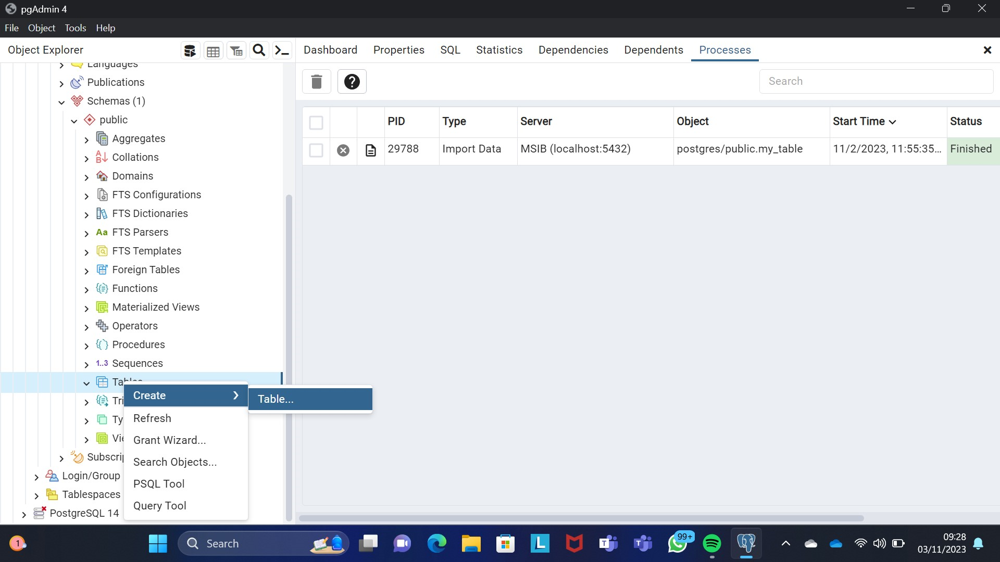

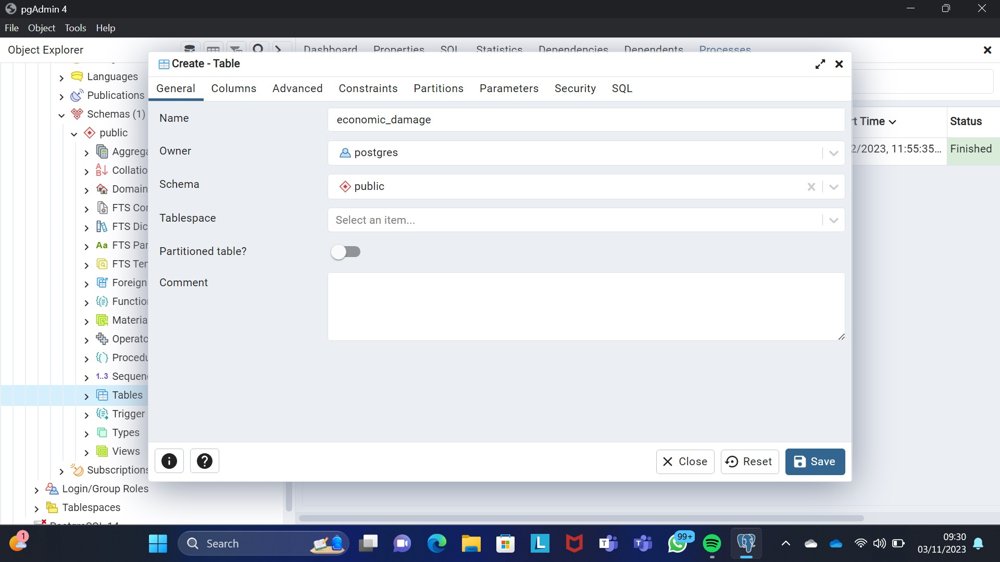



> Membuat kolom pada tabel economic_damage



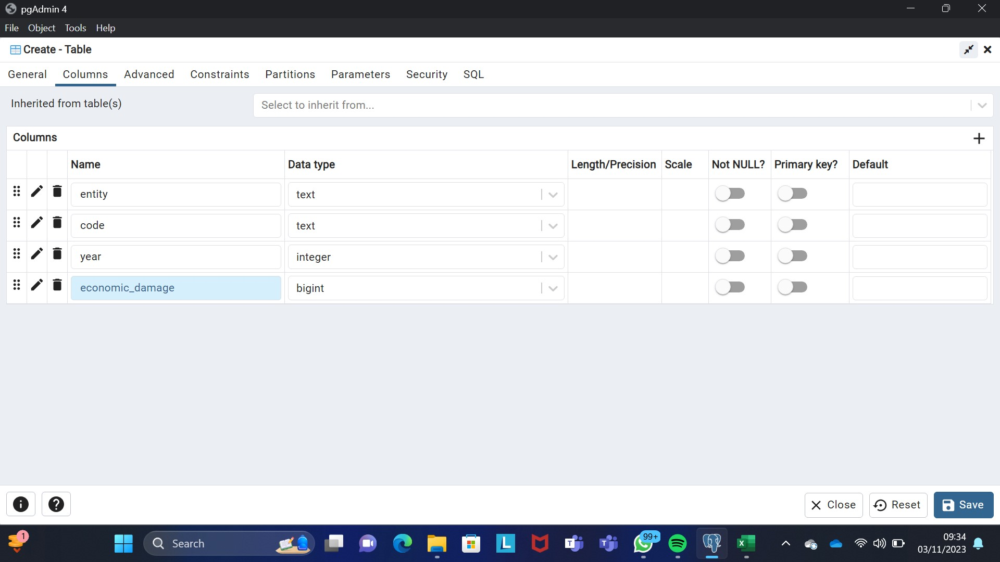



> Mengimpor data



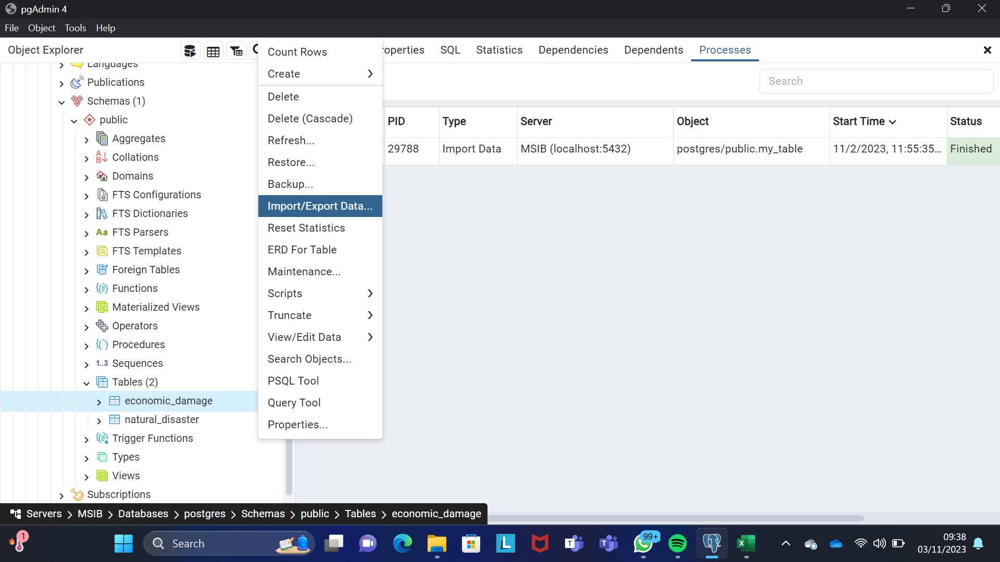

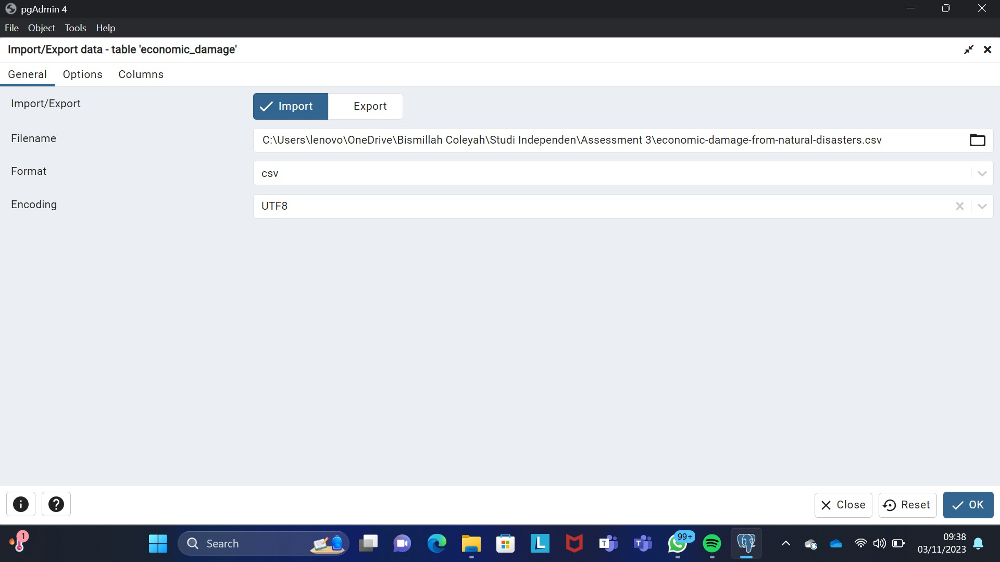

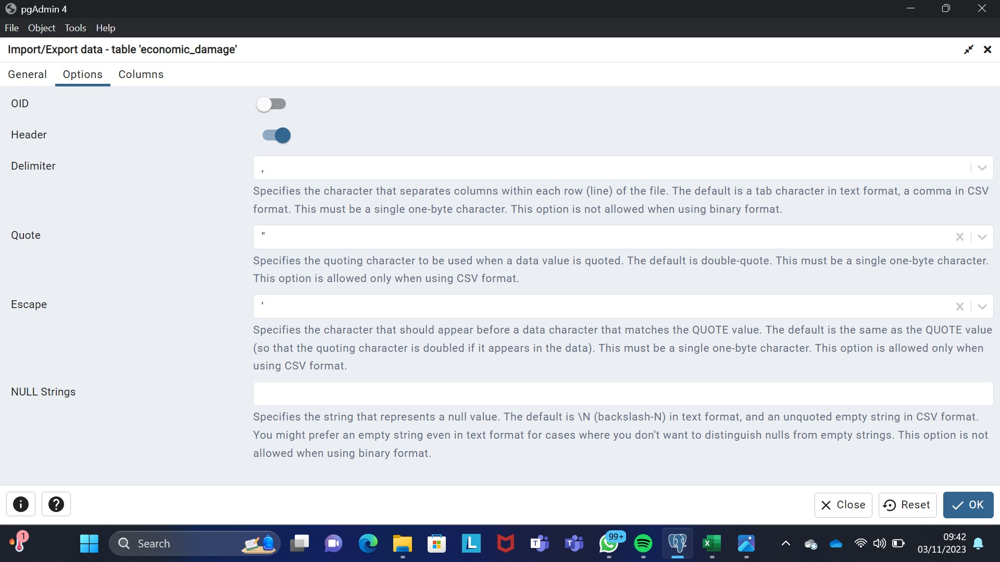

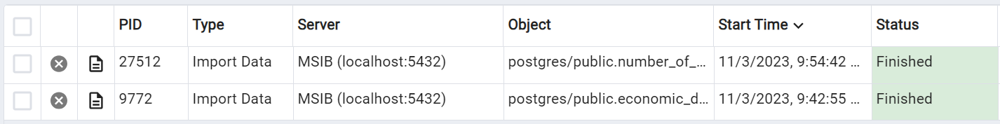

#####**number of reported natural disaster**

> Membuat tabel pada pgAdmin dengan nama number_of_reported_natural_disaster

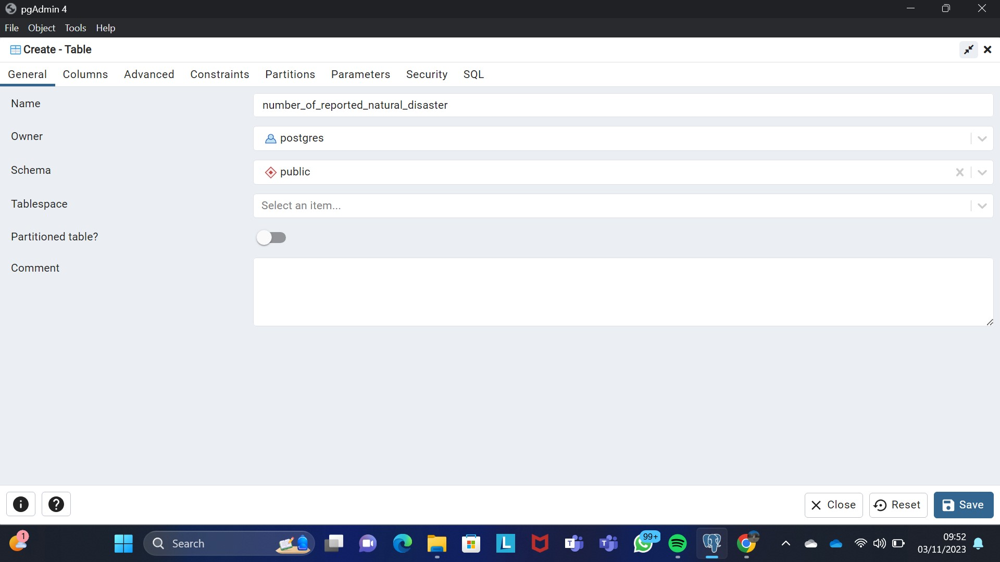

> Membuat kolom pada tabel number_of_reported_natural_disaster

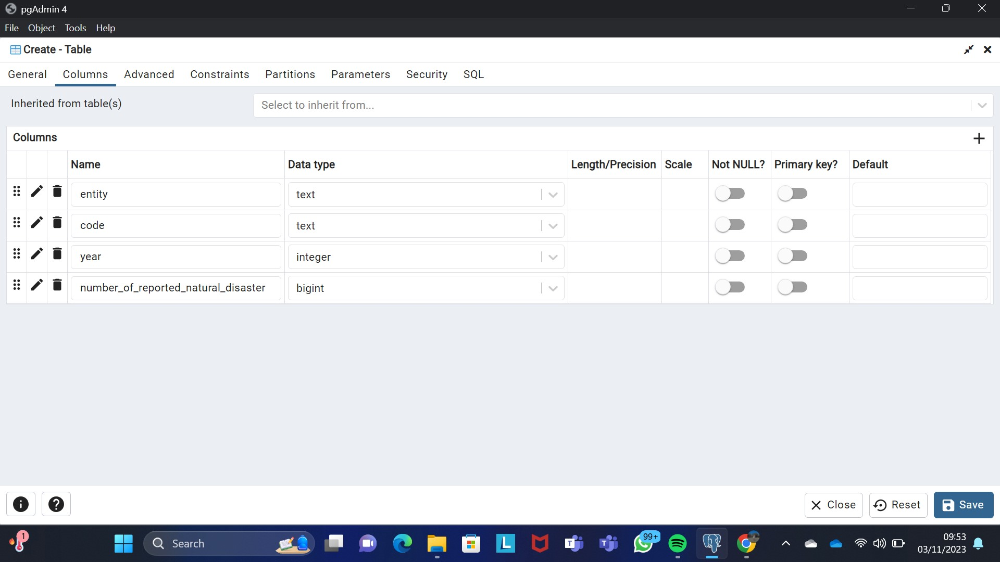



> Mengimpor data


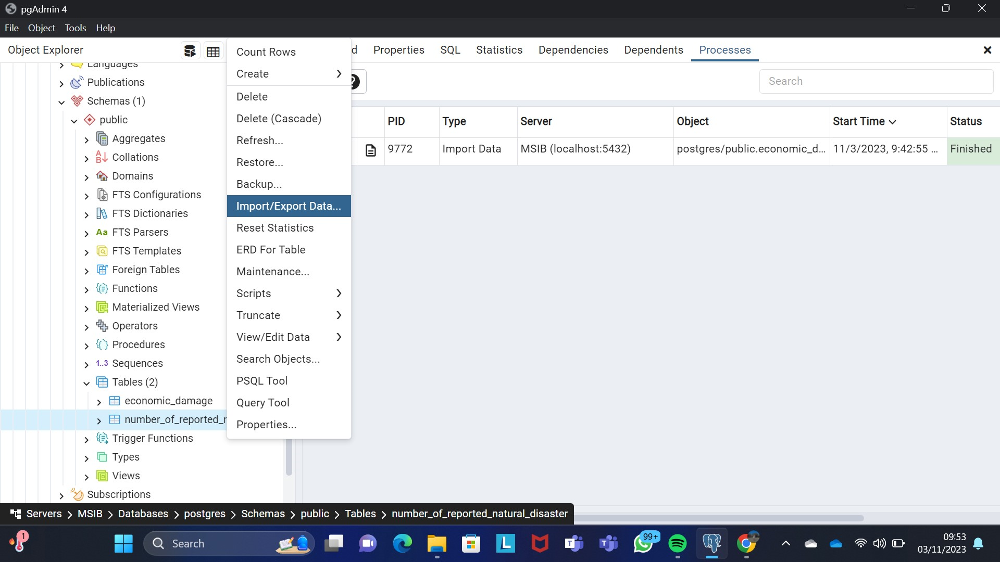

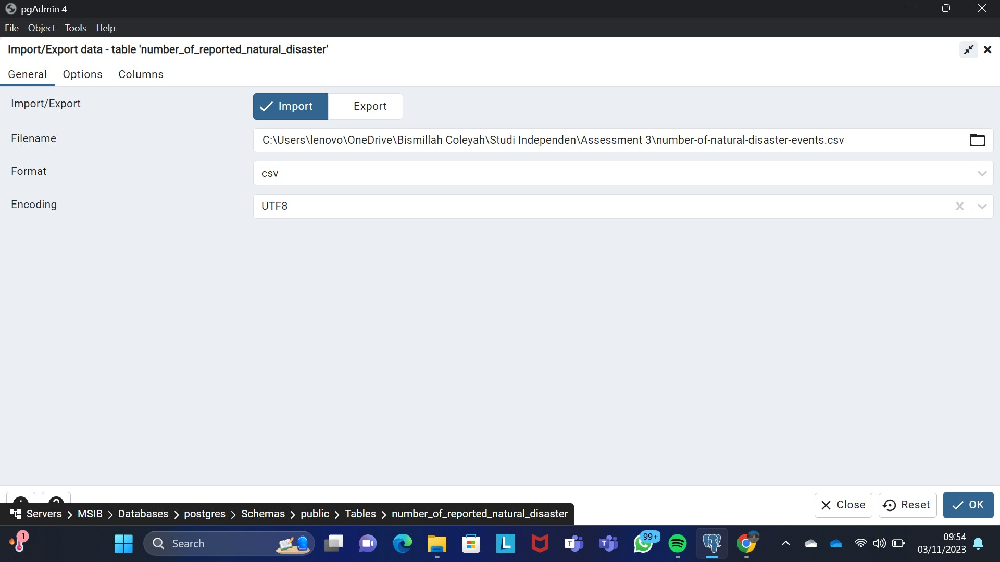

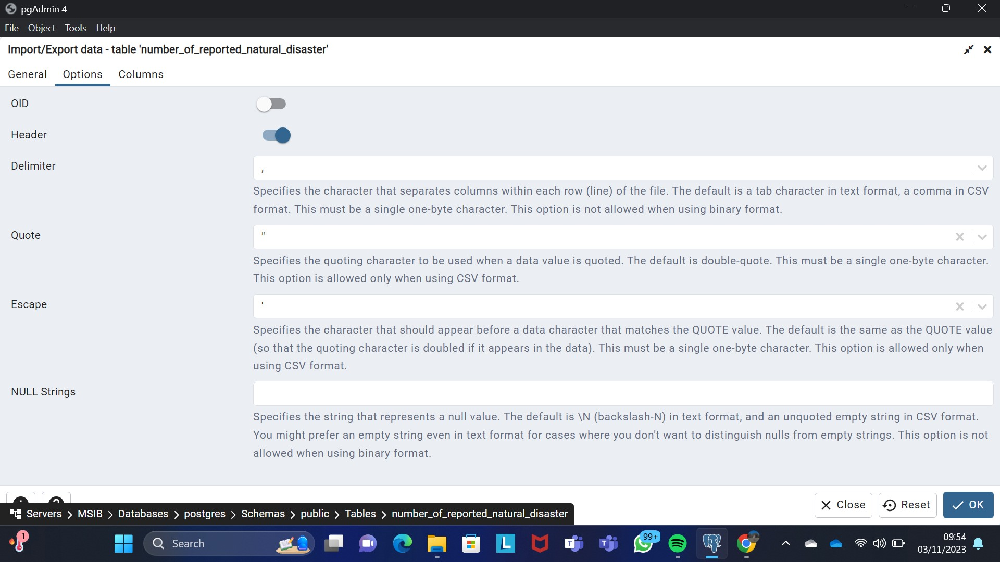

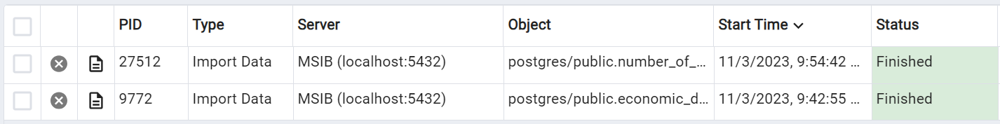

####**1.1.2 Write an SQL query to fetch Year and any relevant variables (e.g., Number of natural disasters, Economic damage)**

#####**economic damage**



> Memanggil tabel economic_damage



In [ ]:
SELECT
	*
FROM
	economic_damage

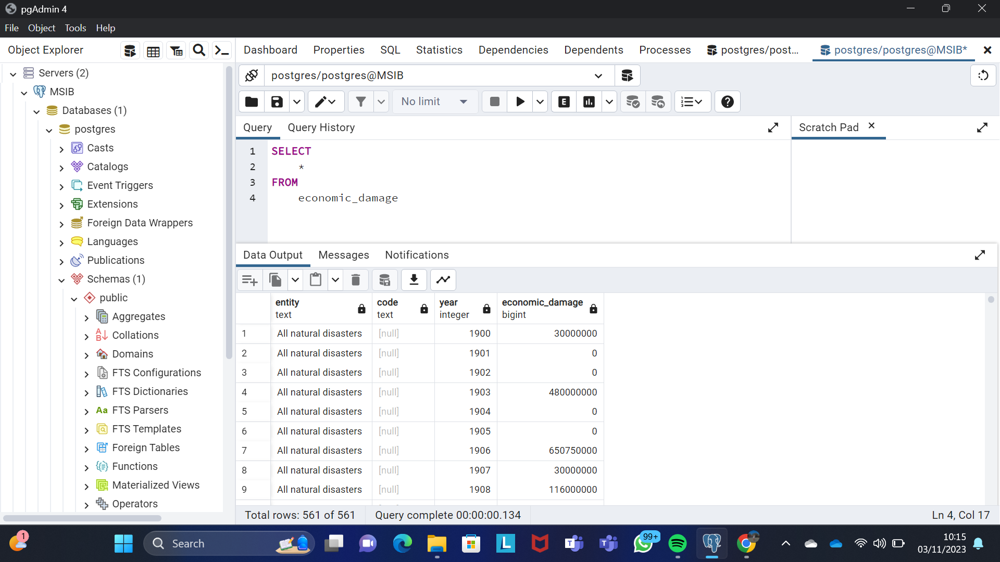

**Interpretasi**

---
Berdasarkan gambar di atas dapat diketahui bahwa tabel data economic_damage terdiri dari 4 kolom atribut serta 561 baris data. Untuk kolomnya terdiri dari entity, code, year serta economic_damage.



> Mengecek null pada atribut code



In [ ]:
SELECT
	code, count(year)
FROM
	economic_damage
group by code

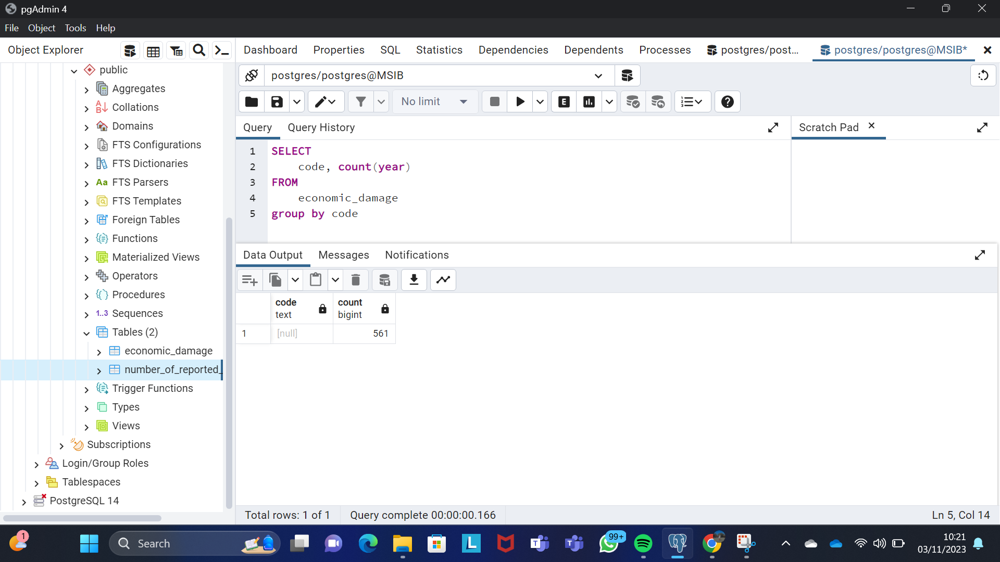

**Interpretasi**

---
Pada output di atas terlihat bahwa terdapat 561 baris null pada kolom code sehingga kolom code bisa dihapus. Berikut merupakan prosesnya.

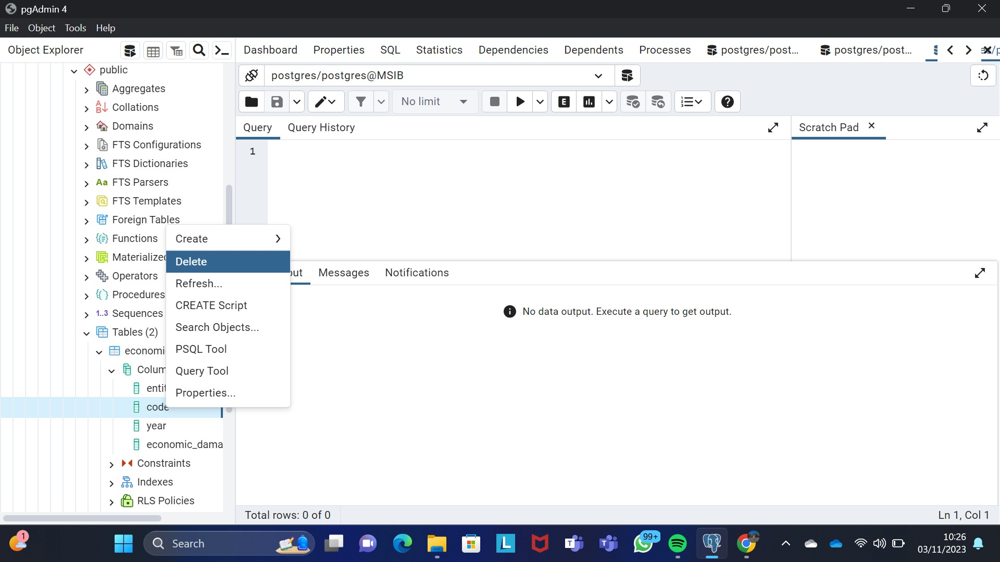



> Memanggil ulang tabel economic_damage setelah kolom code dihapus



In [ ]:
SELECT
	*
FROM
	economic_damage

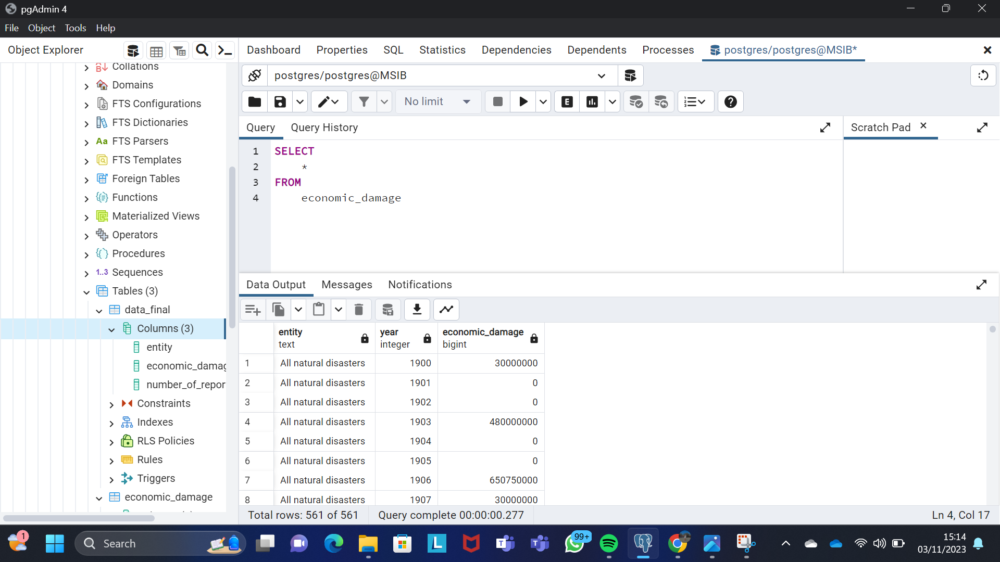

#####**number of natural disaster events**

> Memanggil tabel number_of_reported_natural_disaster

In [ ]:
SELECT
	*
FROM
	number_of_reported_natural_disaster

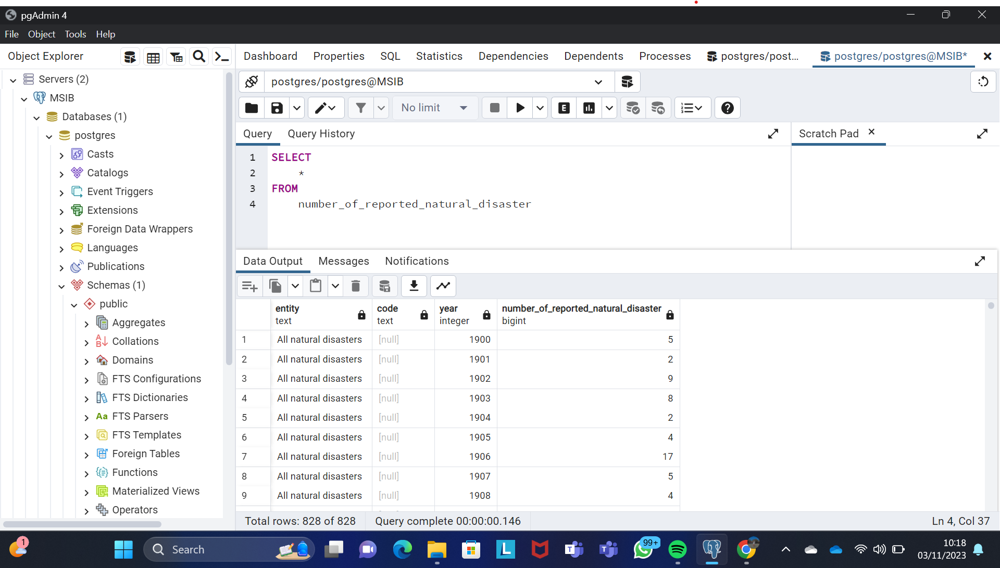

**Interpretasi**

---
Berdasarkan gambar di atas dapat diketahui bahwa tabel data number_of_reported_natural_disaster terdiri dari 4 kolom atribut serta 828 baris data. Untuk kolomnya terdiri dari entity, code, year serta number_of_reported_natural_disaster .

> Mengecek null pada atribut code

In [ ]:
SELECT
	code, count(year)
FROM
	number_of_reported_natural_disaster
group by code

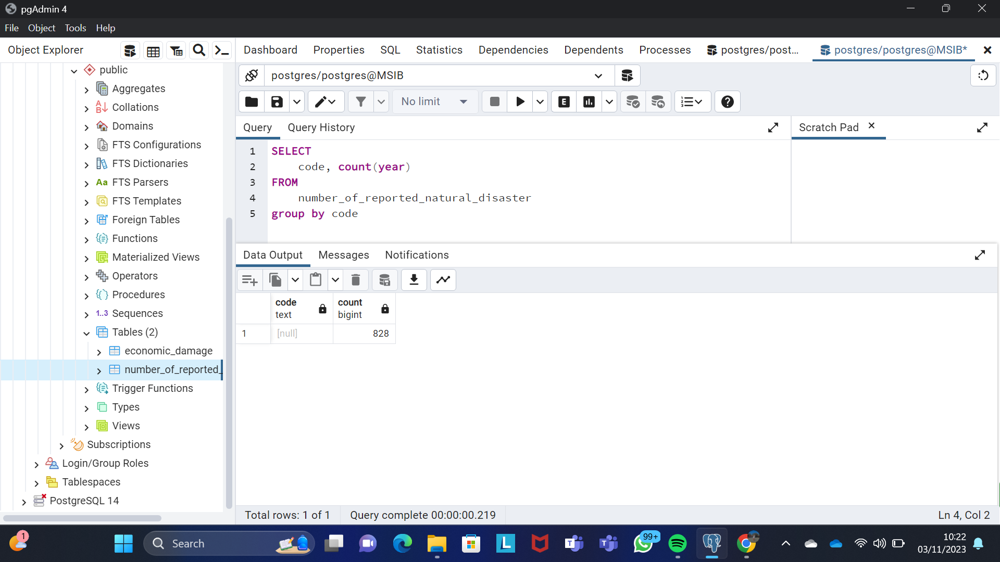

**Interpretasi**

---
Pada output di atas terlihat bahwa terdapat 828 baris null pada kolom code sehingga kolom code bisa dihapus. Berikut merupakan prosesnya.

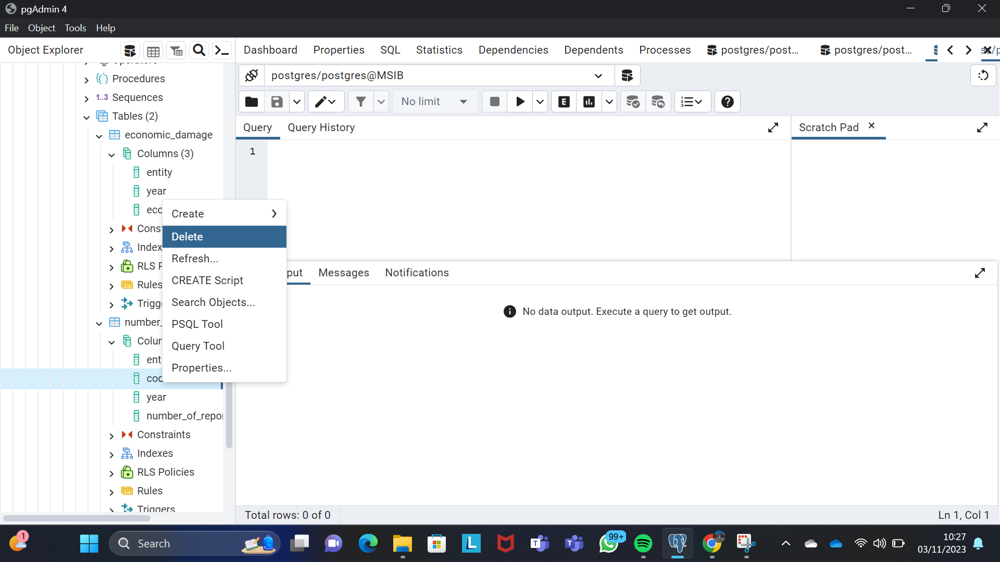


> Memanggil ulang tabel number_of_reported_natural_disaster setelah kolom code dihapus



In [ ]:
SELECT
	*
FROM
	number_of_reported_natural_disaster

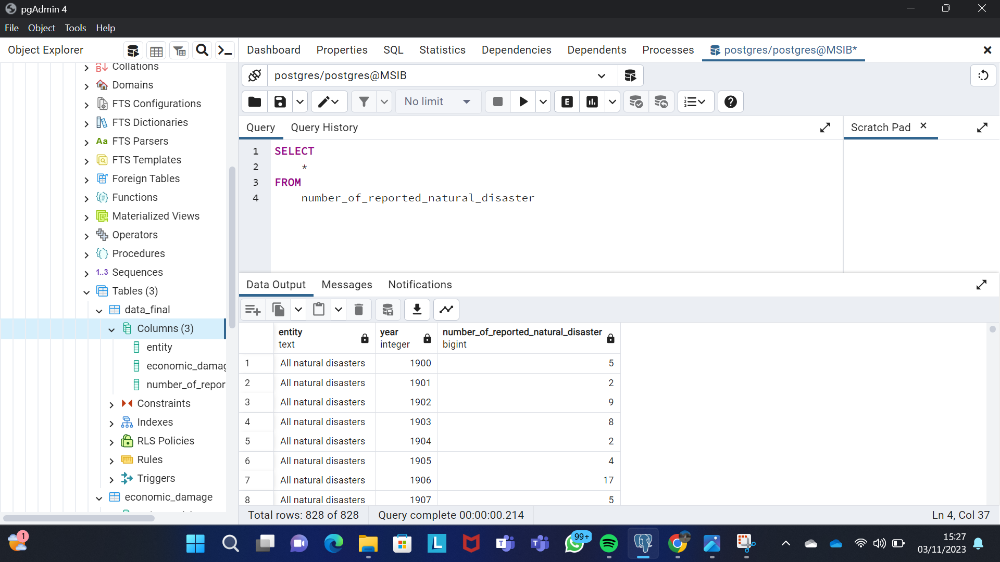

###**1.2 Database: SQL Query II**

####**1.2.1 Write SQL query to show Total Natural Disaster and Economic Damage for every type of Disaster (Entity)**



> Menggabungkan kedua tabel economic damage dan number of reported natural disaster melalui proses join



In [ ]:
SELECT
	*
FROM
	economic_damage ed
	FULL JOIN number_of_reported_natural_disaster nr
	ON ed.year = nr.year and ed.entity = nr.entity

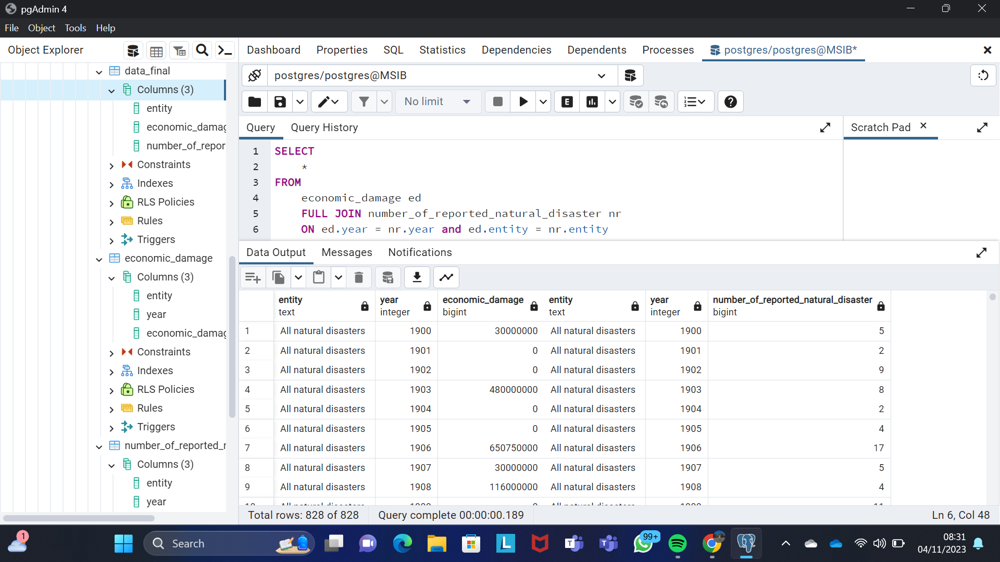

**Interpretasi**

---
Output di atas merupakan hasil penggabungan dari kedua tabel, yaitu tabel economic damage dengan number of reported natural disaster. Dari gabungan tabel tersebut terdapat 6 kolom dan 828 baris.



> Setelah proses join berhasil, kemudian membuat tabel baru yang berisi hasil dari proses join tersebut dan diberi nama data final.



In [ ]:
CREATE TABLE data_final AS
SELECT
	COALESCE(ed.entity, nr.entity) AS entity,
	COALESCE(ed.year, nr.year) AS year, economic_damage, number_of_reported_natural_disaster
FROM
	economic_damage ed
	FULL JOIN number_of_reported_natural_disaster nr
	ON ed.year = nr.year and ed.entity = nr.entity

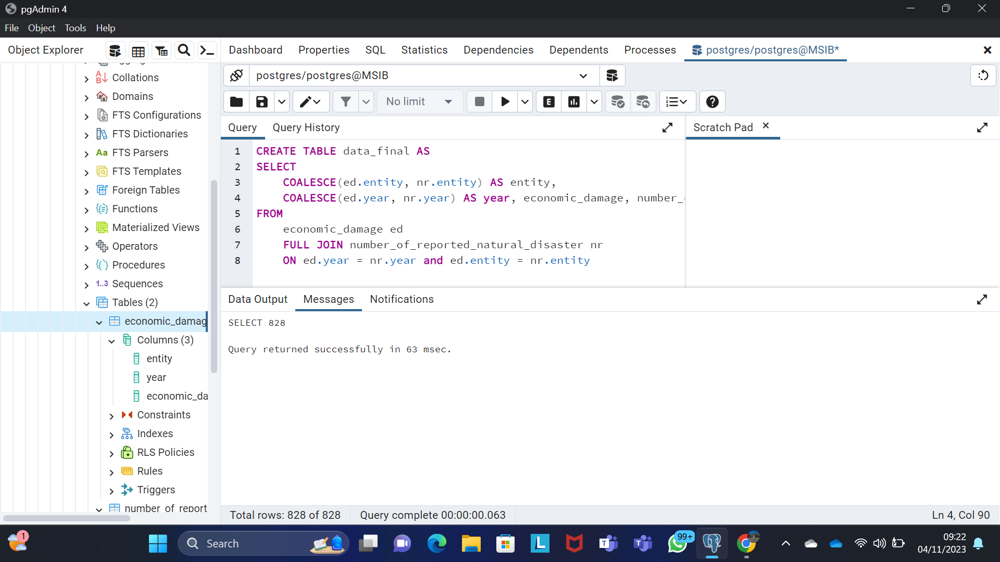

In [ ]:
SELECT
	*
FROM
	data_final

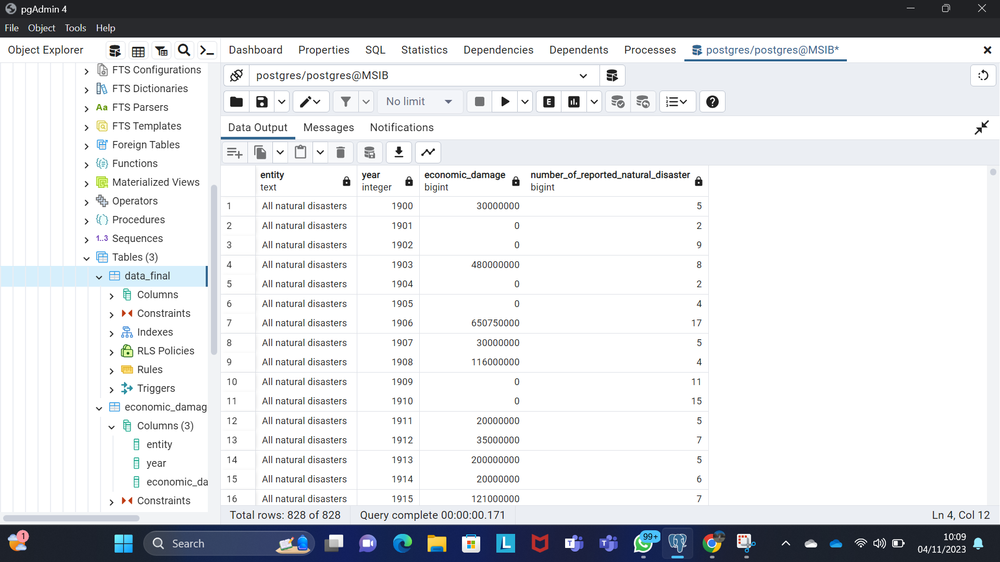

**Interpretasi**

---
Tabel final di atas diberi nama data final yang didalamnya terdiri dari 4 kolom, yakni kolom entity, year, economic_damage, dan number_of_reported_natural_disaster serta 828 baris.

#####**1.2.1.1 Banyak kejadian yang muncul pada variabel economic_damage dan number_of_reported_natural_disaster pada setiap entity nya**

In [ ]:
SELECT
	entity,
	COUNT(economic_damage) AS banyak_economic_damage,
	COUNT(number_of_reported_natural_disaster) AS banyak_reported_natural_disaster
FROM
	data_final
GROUP BY entity
ORDER BY entity asc

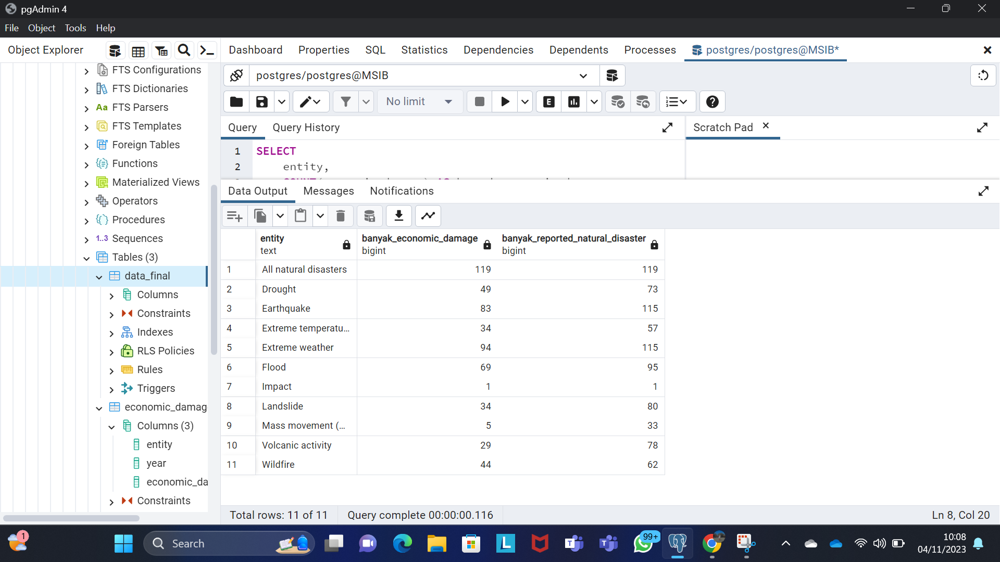

#####**1.2.1.2 Jumlah total kejadian yang terjadi pada variabel economic_damage dan number_of_reported_natural_disaster pada setiap entity nya**

In [ ]:
SELECT
	entity,
	SUM(economic_damage) AS total_economic_damage,
	SUM(number_of_reported_natural_disaster) AS total_reported_natural_disaster
FROM
	data_final
GROUP BY entity
ORDER BY entity asc

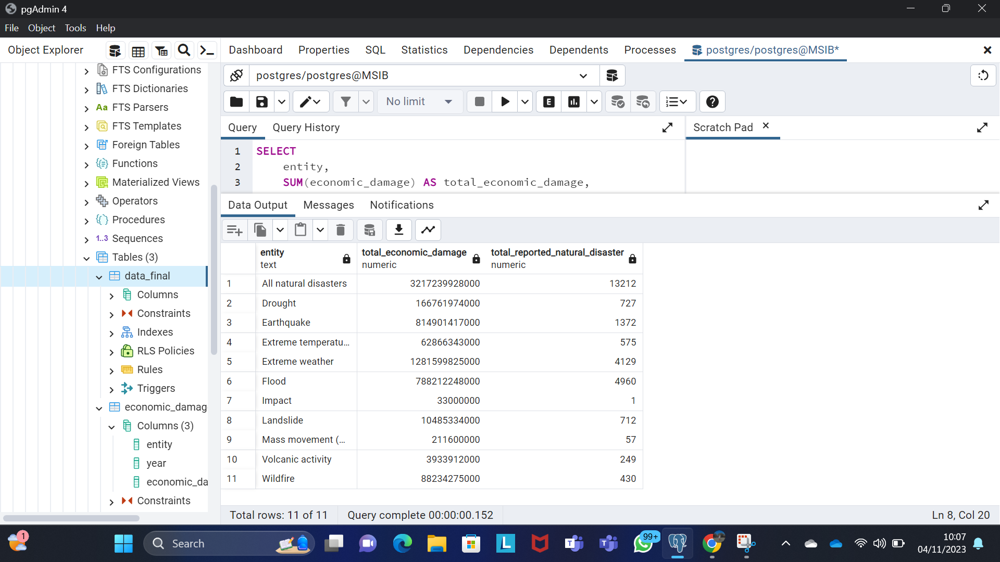

**Interpretasi**

---
Kedua output di atas merupakan hasil dari menuliskan query SQL untuk menentukan banyak kejadian maupun jumlah total kejadian yang terjadi pada variabel economic_damage maupun number_of_reported_natural_disaster berdasarkan entitasnya atau tipe bencananya. Jadi setiap entitas terlihat banyak kejadian maupun jumlah total kejadiannya.

####**1.2.2 Write an SQL query to summarize the data per 10 year, calculating averages and sums for Natural**

In [ ]:
SELECT
	min(year) as decade,
	cast(avg(economic_damage) as bigint) as rerata_economic_damage,
	cast(sum(economic_damage) as bigint) as jumlahtotal_economic_damage,
	cast(avg(number_of_reported_natural_disaster) as bigint) as rerata_reported_natural_disaster,
	cast(sum(number_of_reported_natural_disaster) as bigint) as jumlahtotal_reported_natural_disaster
FROM
	data_final
GROUP BY
	FLOOR(year/10) * 10
ORDER BY
	decade asc

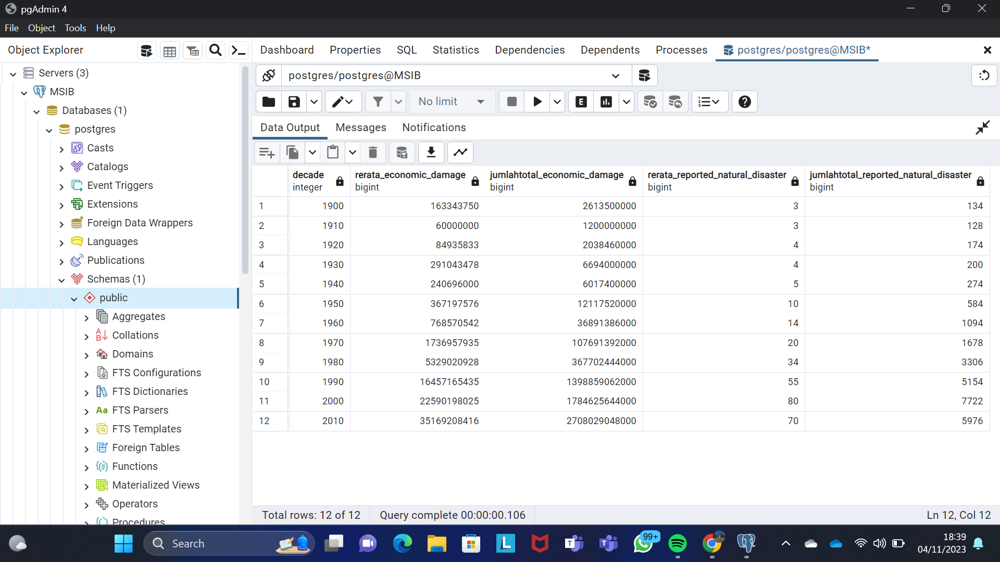

**Interpretasi**

---
Berdasarkan query serta output di atas dihasilkan statistik agregat (avg dan sum) pada setiap dekade. Output yang dikeluarkan antara lain rerata economic damage, jumlah total economic damage, rerata reported natural disaster, dan jumlah total reported natural disaster. Hasil tersebut berdasarkan data tahun minimum dalam setiap kelompok dekade. Urutan datanya mulai dari yang minimum hingga maksimum. Penghitungan statistik agregat ini bisa digunakan untuk menganalisis tren economic damage dan reported natural disaster selama beberapa dekade.

#####**Tampilan grafik**







> Membuat tabel baru bernama data



In [ ]:
CREATE TABLE data AS
SELECT
	min(year) as decade,
	cast(avg(economic_damage) as bigint) as rerata_economic_damage,
	cast(sum(economic_damage) as bigint) as jumlahtotal_damage,
	cast(avg(number_of_reported_natural_disaster) as bigint) as rerata_reported_natural_disaster,
	cast(sum(number_of_reported_natural_disaster) as bigint) as jumlahtotal_reported_natural_disaster
FROM
	data_final
GROUP BY
	FLOOR(year/10)
ORDER BY
	decade asc

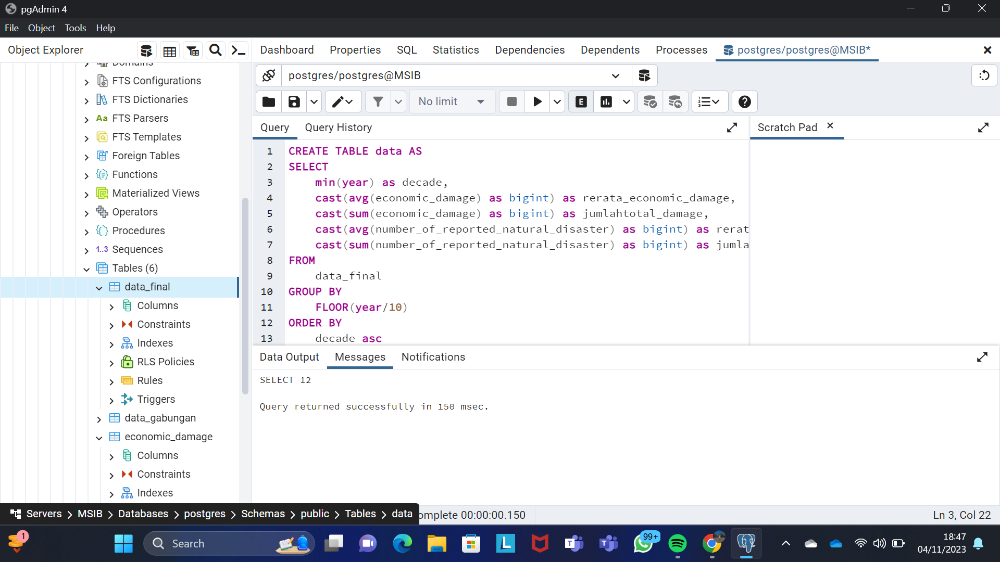



> Memanggil tabel data



In [ ]:
SELECT
	*
FROM
	data

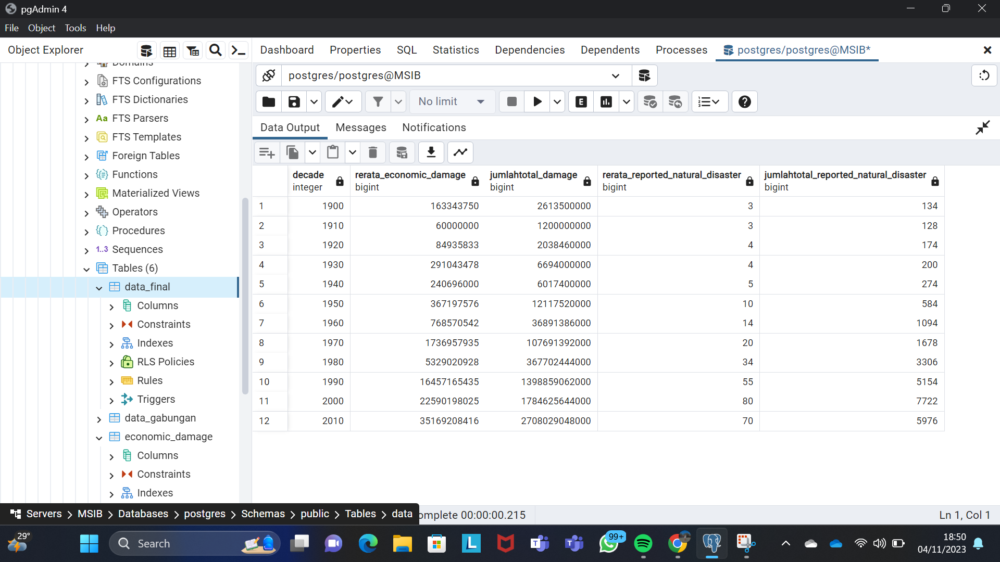



> Grafik antara dekade dengan rerata economic damage



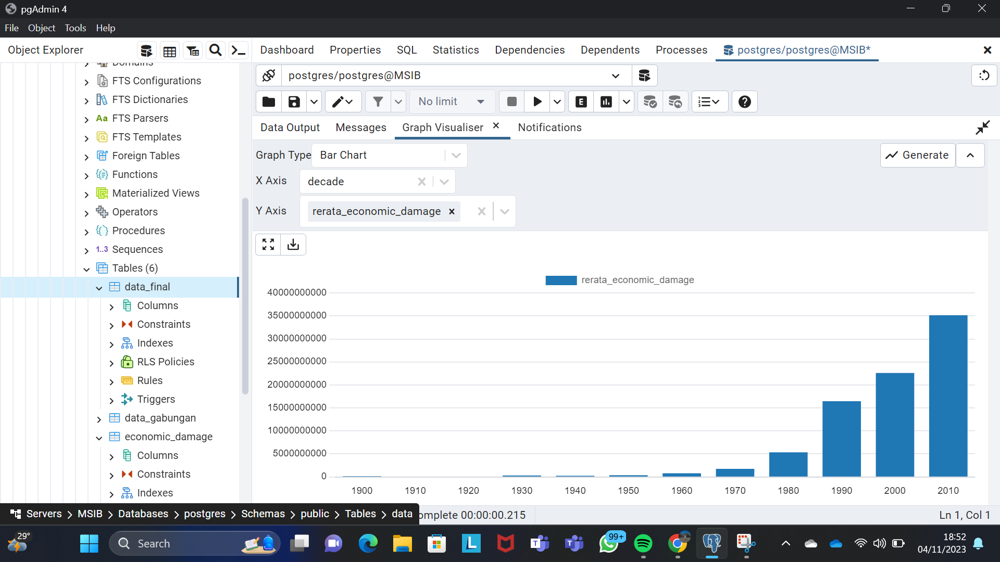



> Grafik antara dekade dengan rerata reported natural disaster



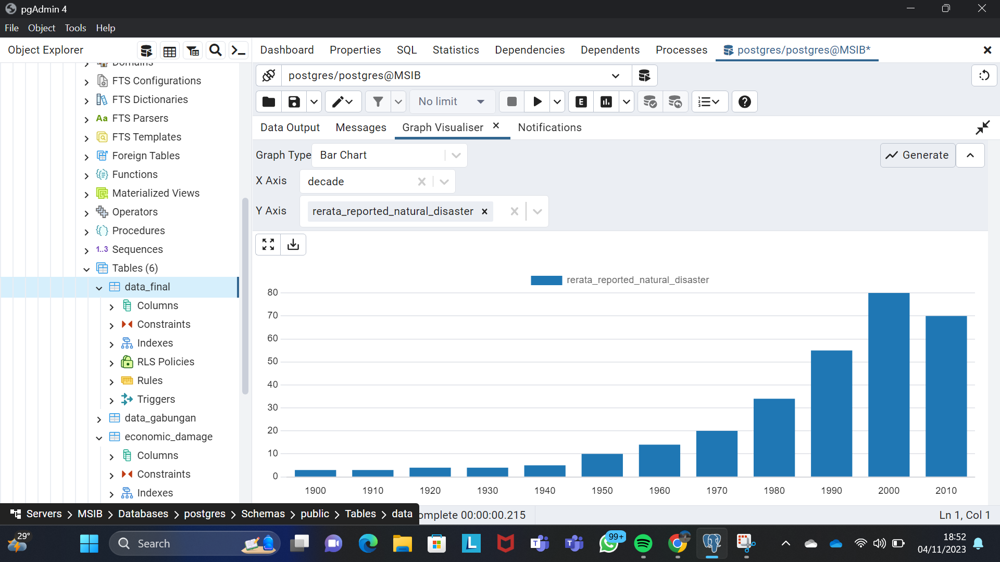



> Sebelum masuk part 2, harus menyiapkan data yang sudah diproses pada postgresSQL. Datanya bisa diexport atau mengkoneksikan google colab dengan postgresSQL. Disini saya memilih untuk mengekspor data.



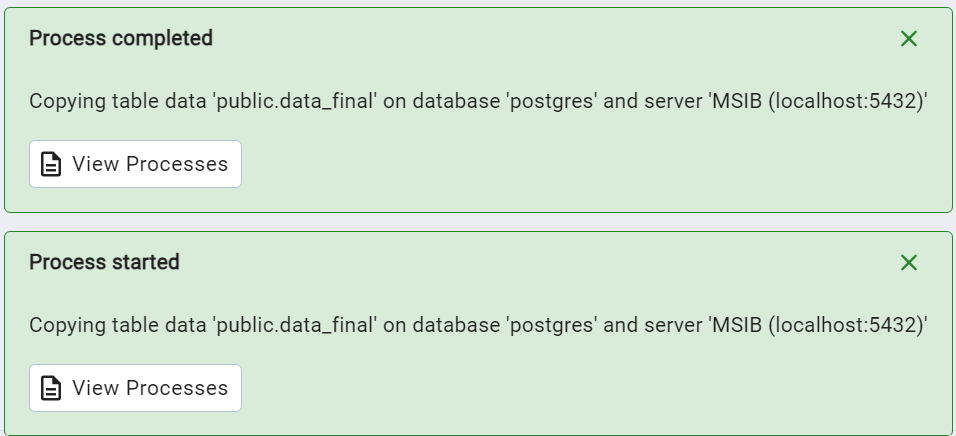

##**Part 2: Data Science and Statistical Analysis**


Refer to the previous assignment framework for exercises on Descriptive and Inferential Statistics, EDA, and Statistical Modeling.

###**Import Library**

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import scipy

###**Import Data**

In [ ]:
from google.colab import files
uploades = files.upload()

Saving Data Final.csv to Data Final (1).csv


In [ ]:
df = pd.read_csv('Data Final.csv',sep=";")
df.head()

,entity,year,economic_damage,number_of_reported_natural_disaster
0,All natural disasters,1900,30000000.0,5
1,All natural disasters,1901,0.0,2
2,All natural disasters,1902,0.0,9
3,All natural disasters,1903,480000000.0,8
4,All natural disasters,1904,0.0,2


###**Data Understanding**

In [ ]:
#melihat informasi dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 828 entries, 0 to 827
Data columns (total 4 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   entity                               828 non-null    object 
 1   year                                 828 non-null    int64  
 2   economic_damage                      561 non-null    float64
 3   number_of_reported_natural_disaster  828 non-null    int64  
dtypes: float64(1), int64(2), object(1)
memory usage: 26.0+ KB


**Interpretasi**

---
Dari hasil output di atas, dapat dilihat bahwa tipe datanya berupa numerik dan string (objek). Tipe data numerik terdiri dari tipe data integer yang menyatakan bilangan bulat serta tipe data float yang menyatakan bilangan memiliki koma(desimal). Variabel yang bertipe data integer adalah variabel year dan number_of_reported_natural_disaster.  Sedangkan, untuk variabel yang bertipe data float adalah variabel economic_damage. Untuk variabel entity memiliki tipe data berupa objek.

###**Data Pre-Processing**

In [ ]:
#mengahapus baris all natural disaster pada kolom entity
df.drop(df[df['entity'] == 'All natural disasters'].index, inplace=True)
df.reset_index(drop=True, inplace=True)
df

,entity,year,economic_damage,number_of_reported_natural_disaster
0,Drought,1965,127118000.0,7
1,Drought,1967,600200000.0,5
2,Drought,1968,64000000.0,7
3,Drought,1969,215000000.0,10
4,Drought,1970,2100000.0,2
...,...,...,...,...
704,Volcanic activity,2010,NaN,6
705,Extreme temperature,1953,NaN,3
706,Earthquake,1917,NaN,3
707,Wildfire,1986,NaN,6


In [ ]:
#melihat duplikasi data pada dataset
df.duplicated().sum()

0

In [ ]:
#melihat missing values
df.isnull().sum()

entity                                   0
year                                     0
economic_damage                        267
number_of_reported_natural_disaster      0
dtype: int64

**Interpretasi**

---

Setelah dilakukan pengecekan, terlihat bahwa tidak adanya gejala duplikasi data pada dataset. Akan tetapi masih terdapat missing value pada variabel economic_damage sebanyak 267.

In [ ]:
#handling missing value
average = df.groupby(['entity'])['economic_damage'].median().to_dict()
#impute missing values with entity of economic_damage
df.loc[:,'economic_damage'] = df.apply(lambda x: average[(x['entity'])] if np.isnan(x['economic_damage']) else x['economic_damage'],axis=1)

In [ ]:
#melihat missing values
df.isnull().sum()

entity                                 0
year                                   0
economic_damage                        0
number_of_reported_natural_disaster    0
dtype: int64

In [ ]:
#melihat informasi statistika deskriptif
df.describe()

,year,economic_damage,number_of_reported_natural_disaster
count,709.000000,7.090000e+02,709.000000
mean,1971.269394,4.853705e+09,18.634697
std,31.888567,1.615254e+10,32.952765
min,1900.000000,0.000000e+00,1.000000
25%,1949.000000,5.500000e+07,2.000000
50%,1977.000000,6.258000e+08,6.000000
75%,1998.000000,2.067714e+09,19.000000
max,2018.000000,2.303000e+11,226.000000


**Interpretasi**

---
Dari output di atas kita dapat melihat jumlah data, nilai mean, nilai standar deviasi, nilai maksimal, nilai minimal, nilai quantile 1, quantile 2 dan quntile 3 pada masing-masing variabel.

###**Exploratory Data Analysis**

####**Histogram Plots**

In [ ]:
px.histogram(df, x = 'year', y = 'economic_damage')

**Interpretasi**

---
Berdasarkan grafik histogram plot di atas, dapat dilihat juga bahwa jumlah total nilai economic damage tertinggi terjadi pada tahun 2010-2014. Sedangkan, jumlah total nilai economic damage terendah terjadi pada tahun 1925-1929.

In [ ]:
px.histogram(df, x = 'entity', y = 'economic_damage')

**Interpretasi**


---

Dari output histogram plot di atas, dapat dilihat bahwa extreme weather (cuaca ekstrim) menjadi jumlah kerusakan ekonomi yang paling besar selama tahun 1900 -2018. Peringkat kedua ditempati oleh flood (banjir) dan untuk peringkat ketiga ditempati oleh earthquake (gempa bumi). Sedangkan, untuk jumlah kerusakan ekonomi yang paling kecil selama tahun 1900 - 2018 adalah impact.

In [ ]:
px.histogram(df, x = 'year', y = 'number_of_reported_natural_disaster')

**Interpretasi**

---
Berdasarkan grafik histogram plot di atas, dapat dilihat bahwa jumlah total bencana yang dilaporkan tertinggi terjadi pada tahun 2005-2009. Sedangkan, jumlah total bencana yang dilaporkan terendah terjadi pada tahun 1900 -1909 dan 1915-1919.

In [ ]:
px.histogram(df, x = 'entity', y = 'number_of_reported_natural_disaster')

**Interpretasi**


---


Dari output di atas, dapat dilihat bahwa total flood (banjir) menjadi bencana yang dilaporkan paling sering terjadi selama tahun 1900 -2018. Peringkat kedua ditempati oleh extreme weather (cuaca ekstrim) dan untuk peringkat ketiga adalah earthquake (gempa bumi). Sedangkan, untuk bencana yang yang paling jarang dilaporkan selama tahun 1900 - 2018 adalah impact.

####**Density Plots**

<ipython-input-22-54e29ab680d3>:1: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




Text(0.5, 1.0, 'Density Plot of Economic Damage')

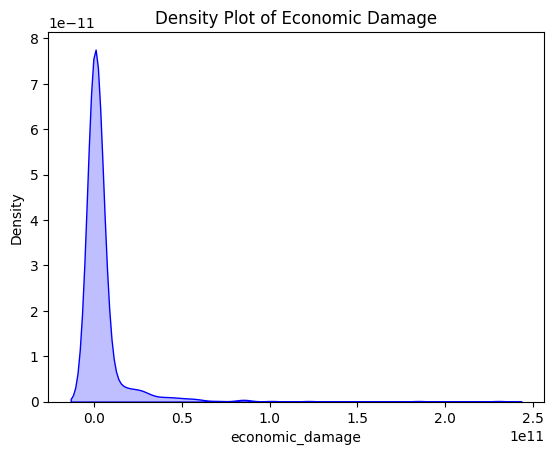

In [ ]:
sns.kdeplot(df['economic_damage'], shade = True, color = 'blue')
plt.title("Density Plot of Economic Damage")

In [ ]:
#mencari nilai skewness (kecondongan)
print(scipy.stats.skew(df['economic_damage'], axis=0, bias=True))

7.794490910546351


**Interpretasi**

---
Berdasarkan grafik histogram plot di atas, dapat dilihat bahwa sebaran data condong ke sebelah kiri (positive skewness). Hal ini dapat dibuktikan dari hasil nilai skewness yang lebih besar dari 0 yang berarti bentuk distribusinya positive (positive skewness). Tetapi, data tersebut menunjukan ketidak normalan karena nilai skewness (7,794490910546351) berada di luar rentang nilai skewness -2 sampai dengan 2.

<ipython-input-24-e10f4325e3e6>:1: FutureWarning:



`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.




Text(0.5, 1.0, 'Density Plot of Reported Natural Disaster')

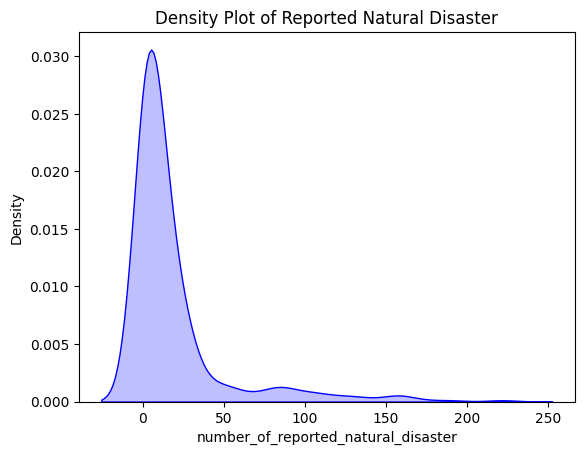

In [ ]:
sns.kdeplot(df['number_of_reported_natural_disaster'], shade = True, color = 'blue')
plt.title("Density Plot of Reported Natural Disaster")

In [ ]:
#mencari nilai skewness (kecondongan)
print(scipy.stats.skew(df['number_of_reported_natural_disaster'], axis=0, bias=True))

3.140247881143782


**Interpretasi**

---
Berdasarkan grafik histogram plot di atas, dapat dilihat bahwa sebaran data condong ke sebelah kiri (positive skewness). Hal ini dapat dibuktikan dari hasil nilai skewness yang lebih besar dari 0 yang berarti bentuk distribusinya positive (positive skewness). Tetapi, data tersebut menunjukan ketidak normalan karena nilai skewness (3,140247881143782) berada di luar rentang nilai skewness -2 sampai dengan 2.

####**Scatter Plots**

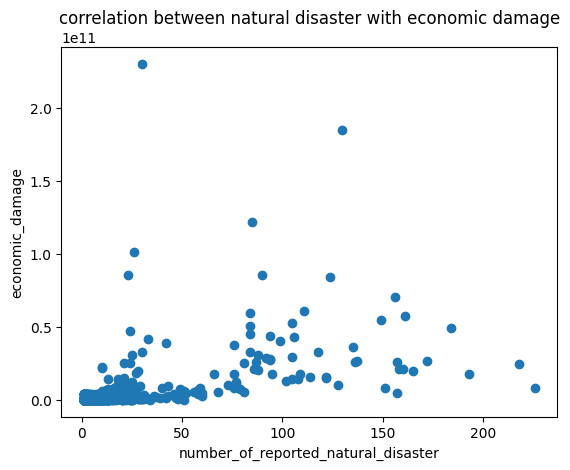

In [ ]:
plt.scatter(df['number_of_reported_natural_disaster'], df['economic_damage'])
plt.xlabel('number_of_reported_natural_disaster')
plt.ylabel('economic_damage')
plt.title('correlation between natural disaster with economic damage')
plt.show()

**Interpretasi**


---
Dari grafik di atas, dapat dilihat bahwa semakin besar nilai number_of_reported_natural_disaster, maka akan semakin besar pula nilai economic_damage walaupun tidak terlalu signifikan. Sehingga, dapat disimpulkan bahwa hubungannya positif (Positive Correlation).

####**Correlation Matrices**

<ipython-input-27-2512e6e41015>:1: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



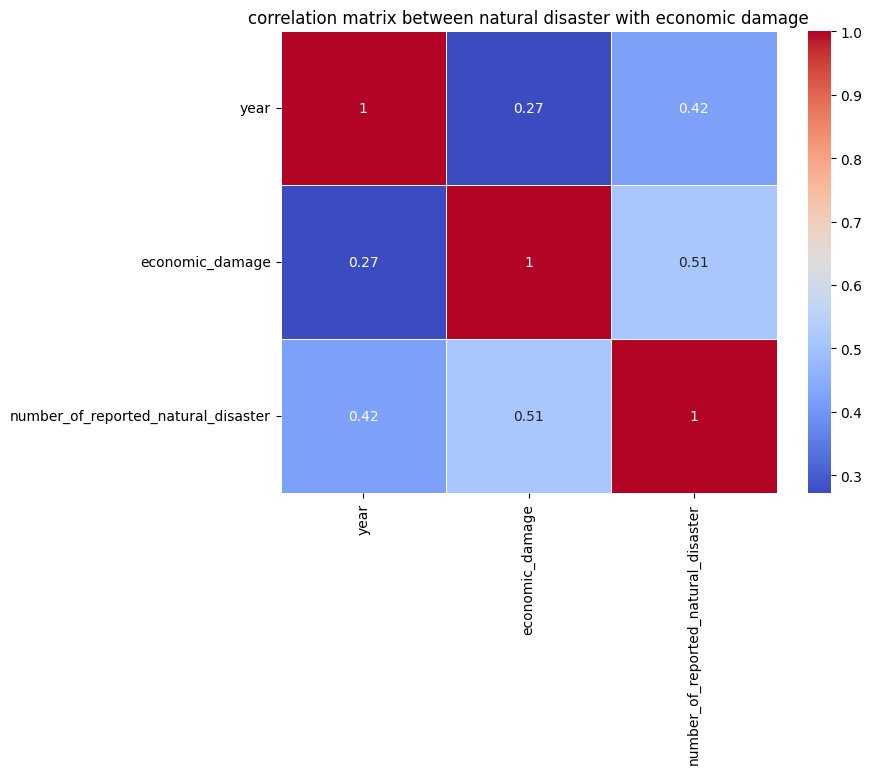

In [ ]:
correlation_matrix = df.corr()
plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', linewidths=.5)
plt.title('correlation matrix between natural disaster with economic damage')
plt.show()

**Interpretasi**


---
Berdasarkan output matriks korelasi di atas, dapat diketahui bahwa antara variabel number_of_reported_natural_disaster dengan variabel economic_damage memiliki hubungan yang cukup kuat dan positif dengan nilai korelasinya sebesar 0,51. Antara variabel year dengan variabel economic_damage memiliki hubungan positif dan tidak terlalu kuat dengan nilai korelasinya sebesar 0,27. Begitu pun korelasi antara variabel year dengan number_of_reported_natural_disaster, yaitu positif dan tidak terlalu kuat dengan nilai korelasi sebesar 0,42.

###**Statistical Modeling**

**Akan dilakukan pemodelan menggunakan regression analysis untuk melihat apakah variabel number_of_reported_natural_disaster (variabel X) berpengaruh terhadap variabel economic_damage (variabel Y).**

Apabila data cenderung tidak normal, maka dapat digunakan asumsi Central Limit Theorem yaitu jika jumlah observasi lebih dari 30, maka tidak perlu dilakukan uji normalitas dan dapat diabaikan (Ajija dkk, 2011:42). Jadi data ini masih bisa dilakukan analisis regresi, walaupun pada keputusan sebelumnya menunjukkan bahwa data tidak normal. Hal ini dikarenakan jumlah observasi yang digunakan banyak, yaitu 828 observasi.

####**Persamaan Model**

In [ ]:
df

,entity,year,economic_damage,number_of_reported_natural_disaster
0,Drought,1965,127118000.0,7
1,Drought,1967,600200000.0,5
2,Drought,1968,64000000.0,7
3,Drought,1969,215000000.0,10
4,Drought,1970,2100000.0,2
...,...,...,...,...
704,Volcanic activity,2010,16655000.0,6
705,Extreme temperature,1953,560000000.0,3
706,Earthquake,1917,940000000.0,3
707,Wildfire,1986,735325000.0,6


In [ ]:
#menentukan variabel regressor (X) dan response (Y)
df_regresi=df[['number_of_reported_natural_disaster','economic_damage']]
df_regresi=df_regresi.rename(columns={"number_of_reported_natural_disaster":"X","economic_damage":"Y"})
df_regresi

,X,Y
0,7,127118000.0
1,5,600200000.0
2,7,64000000.0
3,10,215000000.0
4,2,2100000.0
...,...,...
704,6,16655000.0
705,3,560000000.0
706,3,940000000.0
707,6,735325000.0




> Menghitung nilai intercept dan slope



In [ ]:
df_regresi['(X-X_mean)'] = round(df_regresi['X'] - df_regresi['X'].mean(),2)
df_regresi['(Y-Y_mean)'] = round(df_regresi['Y'] - df_regresi['Y'].mean(),2)
df_regresi['(X-X_mean)(Y-Y_mean)'] = df_regresi['(X-X_mean)'] * df_regresi['(Y-Y_mean)']
df_regresi['pow((X-X_mean),2)'] = round(pow(df_regresi['X'] - df_regresi['X'].mean(),2),2)
df_regresi

,X,Y,(X-X_mean),(Y-Y_mean),(X-X_mean)(Y-Y_mean),"pow((X-X_mean),2)"
0,7,127118000.0,-11.63,-4.726587e+09,5.497021e+10,135.37
1,5,600200000.0,-13.63,-4.253505e+09,5.797527e+10,185.90
2,7,64000000.0,-11.63,-4.789705e+09,5.570427e+10,135.37
3,10,215000000.0,-8.63,-4.638705e+09,4.003202e+10,74.56
4,2,2100000.0,-16.63,-4.851605e+09,8.068219e+10,276.71
...,...,...,...,...,...,...
704,6,16655000.0,-12.63,-4.837050e+09,6.109194e+10,159.64
705,3,560000000.0,-15.63,-4.293705e+09,6.711061e+10,244.44
706,3,940000000.0,-15.63,-3.913705e+09,6.117121e+10,244.44
707,6,735325000.0,-12.63,-4.118380e+09,5.201514e+10,159.64


In [ ]:
#rumus menghitung slope (b1)
b1 = df_regresi['(X-X_mean)(Y-Y_mean)'].sum() / df_regresi['pow((X-X_mean),2)'].sum()
b1

251731467.41944465

In [ ]:
#rumus menghitung intercept (b0)
b0 = df_regresi['Y'].mean() - b1 * df_regresi['X'].mean()
b0

162765505.57728767

In [ ]:
#menuliskan persamaan model regresi
textstr = 'y = '+str(b0)+' + '+str(b1)+' * x'
textstr

'y = 162765505.57728767 + 251731467.41944465 * x'

**Interpretasi**


---
Dari output di atas, didapatkan nilai intercept (𝛽0) dan slope (𝛽1) untuk membetuk persamaan modelnya. Diketahui nilai:

𝛽0 = 162765505,57728767


𝛽1 =  251731467,41944465

Maka dari itu persamaan modelnya dapat dituliskan seperti persamaan berikut.

y = 𝛽0 + 𝛽1 * x.

y = 162765505,57728767 + 251731467,41944465 * x.

Dengan keterangan :

y = response (number of reported natural disaster)

x = regressor (economic damage)

𝛽0 = 162765505,57728767 memiliki arti bahwa apabila nilai economic sebesar 0, maka besar number of reported natural disaster sebesar 162765505,57728767.

𝛽1 = 251731467,41944465 memiliki arti bahwa setiap peningkatan satu satuan variabel economic damage
akan meningkatkan nilai number of reported natural disaster sebesar 251731467,41944465.

####**Uji Signifikansi Parameter dan Kecocokan Model untuk Evaluasi Model**

In [ ]:
import statsmodels.api as sm

In [ ]:
ols_model = sm.OLS(df_regresi['Y'],df_regresi['X'])
ols_results = ols_model.fit()
print(ols_results.summary())

                                 OLS Regression Results                                
Dep. Variable:                      Y   R-squared (uncentered):                   0.325
Model:                            OLS   Adj. R-squared (uncentered):              0.324
Method:                 Least Squares   F-statistic:                              340.5
Date:                Sat, 11 Nov 2023   Prob (F-statistic):                    2.27e-62
Time:                        21:34:52   Log-Likelihood:                         -17562.
No. Observations:                 709   AIC:                                  3.513e+04
Df Residuals:                     708   BIC:                                  3.513e+04
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

**Interpretasi**

---



> **Uji F atau Uji Kecocokan Model**




**-Hipotesis**

H0 : 𝛽0 = 𝛽1 = 0 atau model tidak sesuai

H1 : 𝛽𝑖 ≠ 0 untuk paling sedikit satu i atau model regresi sesuai

**-Taraf Signifikansi**

alfa = 5%

**-Statistik Uji**

Dari output di atas, diperloleh nilai probabilitas F sebesar 2,27e-62.

**-Daerah Kritis**

Tolak H0, jika P-Value < alfa

**-Keputusan**

𝐻0 ditolak karena nilai prob F (2,27e-62) < α (0,05).

**-Kesimpulan**

Pada taraf signifikansi alfa 5%, 𝐻0 ditolak. Sehingga, dapat disimpulkan bahwa model cocok atau model regresi dapat
digunakan untuk memprediksi response.






> **Uji t atau Uji Signifikansi Parameter**





**-Hipotesis**

H0 ∶ 𝛽𝑗 = 0 atau koefisien parameter tidak sesuai

𝐻1 ∶ 𝛽𝑗 ≠ 0 atau koefisien parameter sesuairegresi sesuai

**-Taraf Signifikansi**

alfa = 5%

**-Statistik Uji**

Dari output di atas, diperloleh nilai probabilitas t sebesar 0,000.

**-Daerah Kritis**

Tolak H0, jika P-Value < alfa

**-Keputusan**

𝐻0 ditolak karena nilai prob t (0.000) < α (0,05).

**-Kesimpulan**

Pada taraf signifikansi alfa 5%, 𝐻0 ditolak. Sehingga, dapat disimpulkan bahwa koefisien parameter sesuai atau dengan kata
lain variabel regressor berpengaruh terhadap response.



> **Koefisien Determinasi**



Berdasarkan nilai R-Square, didapatkan nilai sebesar 0.325. Sehingga, dapat diartikan sebesar 32,5% variabel Y dipengaruhi oleh variabel X, sedangkan sisanya sebesar 67,5% variabel Y
dipengaruhi oleh faktor lain.

####**Kesimpulan Akhir**

Berdasarkan uji F, model regresi yang dibuat cocok digunakan untuk menganalisis lebih lanjut terutama untuk melihat prediksi economic damage kedepannya. Sedangkan berdasarkan uji t, koefisien parameter regressor yaitu 𝛽1 berpengaruh
signfikan terhadap response. Sehingga model yang dibangun bisa digunakan untuk menganalisis. Persamaan modelnya sebagai berikut.

y = 162765505,57728767 + 251731467,41944465 * x.

Dengan keterangan :

y = response (number of reported natural disaster)

x = regressor (economic damage)

Sehingga secara umum, dapat disimpulkan bahwa variabel number of reported natural disaster berpengaruh pada variabel economic damage. Semakin banyaknya kejadian bencana alam, kerusakan ekonomi yang dialami juga akan semakin meningkat. Hal ini bisa dilihat juga pada nilai koefisien determinasinya yaitu sebesar 0,325 atau setara dengan 32,5%, yang mengartikan bahwa sebesar 67,5% variasi variabel response (economic damage) dipengaruhi variabel regressor (number of reported natural disaster) sedangkan sisanya variasi variabel response dipengaruhi oleh variabel lainnya.

#**CHECKPOINT 2**

##**Part 3: Data Product Development**

Data Product Development (Dashboard)
Develop a dashboard showcasing:
1. Historical trends for all type of Natural Disasters and the Economic Damage.
2. Predictive models for future Disasters and Economic Damage.
3. Yearly summaries.

###**Predictive models for future Disasters and Economic Damage**

In [ ]:
df['date'] = pd.to_datetime(df['year'].astype(str) + '-01-01')
df

,entity,year,economic_damage,number_of_reported_natural_disaster,date
0,Drought,1965,127118000.0,7,1965-01-01
1,Drought,1967,600200000.0,5,1967-01-01
2,Drought,1968,64000000.0,7,1968-01-01
3,Drought,1969,215000000.0,10,1969-01-01
4,Drought,1970,2100000.0,2,1970-01-01
...,...,...,...,...,...
704,Volcanic activity,2010,16655000.0,6,2010-01-01
705,Extreme temperature,1953,560000000.0,3,1953-01-01
706,Earthquake,1917,940000000.0,3,1917-01-01
707,Wildfire,1986,735325000.0,6,1986-01-01


####**Import Library**

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

#Evaluasi Model
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_percentage_error

####**Data Prediksi Economic Damage**

In [ ]:
#menyiapkan transformer untuk one-hot encoding
preprocessor = ColumnTransformer(
    transformers=[
        ('entity', OneHotEncoder(), ['entity'])
    ],
    remainder='passthrough'
)

#membagi data menjadi fitur (X) dan target (Y) untuk economic_damage
X_ED = df[['year', 'entity']]
Y_ED = df['economic_damage']

#membagi data menjadi data training dan data testing
X_train_ED, X_test_ED, Y_train_ED, Y_test_ED = train_test_split(X_ED, Y_ED, test_size=0.2, random_state=42)

#membuat model regresi linier untuk economic_damage
model_ED = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', LinearRegression())
])

#membuat dataframe untuk hasil prediksi
hasil_prediksi_ED = pd.DataFrame(columns=['year', 'entity', 'economic_damage_prediction'])

#iterasi melalui setiap entitas
for entity in df['entity'].unique():
    #filter data berdasarkan entitas tertentu
    data_entity = df[df['entity'] == entity]

    #melatih model menggunakan data training
    model_ED.fit(data_entity[['year', 'entity']], data_entity['economic_damage'])

    #membuat prediksi untuk tahun 2014-2023
    tahun_prediksi = np.array([2014, 2015, 2016, 2017,2018, 2019, 2020, 2021, 2022, 2023])
    entity_prediksi = np.array([entity] * 10)

    ED_prediksi = model_ED.predict(pd.DataFrame({'year': tahun_prediksi, 'entity': entity_prediksi}))

    #menambahkan hasil prediksi ke dalam dataframe
    prediksi_entity = pd.DataFrame({'year': tahun_prediksi, 'entity': entity_prediksi, 'economic_damage_prediction': ED_prediksi})
    hasil_prediksi_ED = pd.concat([hasil_prediksi_ED, prediksi_entity])

#menampilkan hasil prediksi untuk economic_damage
hasil_prediksi_ED


,year,entity,economic_damage_prediction
0,2014,Drought,4.557810e+09
1,2015,Drought,4.605039e+09
2,2016,Drought,4.652268e+09
3,2017,Drought,4.699497e+09
4,2018,Drought,4.746725e+09
...,...,...,...
5,2019,Wildfire,3.254661e+09
6,2020,Wildfire,3.300054e+09
7,2021,Wildfire,3.345447e+09
8,2022,Wildfire,3.390841e+09


####**Data Prediksi Reported Natural Disaster**

In [ ]:
#menyiapkan transformer untuk one-hot encoding
preprocessor = ColumnTransformer(
    transformers=[
        ('entity', OneHotEncoder(), ['entity'])
    ],
    remainder='passthrough'
)

#membagi data menjadi fitur (X) dan target (Y) untuk reported natural disaster
X_RD = df[['year', 'entity']]
Y_RD = df['number_of_reported_natural_disaster']

#membagi data menjadi data training dan data testing
X_train_RD, X_test_RD, Y_train_RD, Y_test_RD = train_test_split(X_RD, Y_RD, test_size=0.2, random_state=42)

#membuat model regresi linier untuk economic_damage
model_RD = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', LinearRegression())
])

#membuat dataframe untuk hasil prediksi
hasil_prediksi_RD = pd.DataFrame(columns=['year', 'entity', 'reported_natural_disaster_prediction'])

#iterasi melalui setiap entitas
for entity in df['entity'].unique():
    #filter data berdasarkan entitas tertentu
    data_entity = df[df['entity'] == entity]

    #melatih model menggunakan data training
    model_RD.fit(data_entity[['year', 'entity']], data_entity['number_of_reported_natural_disaster'])

    #membuat prediksi untuk tahun 2014-2023
    tahun_prediksi = np.array([2014, 2015, 2016, 2017,2018, 2019, 2020, 2021, 2022, 2023])
    entity_prediksi = np.array([entity] * 10)

    RD_prediksi = model_RD.predict(pd.DataFrame({'year': tahun_prediksi, 'entity': entity_prediksi}))

    #menambahkan hasil prediksi ke dalam dataframe
    prediksi_entity = pd.DataFrame({'year': tahun_prediksi, 'entity': entity_prediksi, 'reported_natural_disaster_prediction': RD_prediksi})
    hasil_prediksi_RD = pd.concat([hasil_prediksi_RD, prediksi_entity])

#menampilkan hasil prediksi untuk economic_damage
hasil_prediksi_RD

,year,entity,reported_natural_disaster_prediction
0,2014,Drought,16.266034
1,2015,Drought,16.433826
2,2016,Drought,16.601618
3,2017,Drought,16.769410
4,2018,Drought,16.937201
...,...,...,...
5,2019,Wildfire,12.188712
6,2020,Wildfire,12.336087
7,2021,Wildfire,12.483463
8,2022,Wildfire,12.630838


####**Evaluation Model**

#####**Economic Damage**

Dalam melakukan evaluasi model terjadi kesalahan karena terdapat kategori-kategori yang tidak dikenal ('unknown categories') dalam kolom 0 (entity) pada saat melakukan transformasi menggunakan suatu encoder. Encoder disini merupakan fungsi yang digunakan untuk mengubah data tipe kategori menjadi representasi numerin yang dapat digunakan untuk pemodelan. Dengan demikian, perlu memastikan kira-kira kategori yang tidak dikenali itu apa dan perlu melakukan penanganan terhadap hal tersebut.

In [ ]:
#melihat kategori unik pada kolom entity dalam data training
train_categories = set(X_train_ED['entity'].unique())
train_categories

{'Drought',
 'Earthquake',
 'Extreme temperature',
 'Extreme weather',
 'Flood',
 'Landslide',
 'Mass movement (dry)',
 'Volcanic activity',
 'Wildfire'}

In [ ]:
#melihat kategori unik pada kolom entity dalam data testing
test_categories = set(X_test_ED['entity'].unique())
test_categories

{'Drought',
 'Earthquake',
 'Extreme temperature',
 'Extreme weather',
 'Flood',
 'Impact',
 'Landslide',
 'Mass movement (dry)',
 'Volcanic activity',
 'Wildfire'}

In [ ]:
#melihat kategori yang tidak dikenal pada data testing
unknown_categories = test_categories - train_categories
print("Unknown categories in test data:", unknown_categories)

Unknown categories in test data: {'Impact'}


In [ ]:
#mengconvert kolom 'entity' ke tipe data kategori
X_train_ED['entity'] = X_train_ED['entity'].astype('category')

#menambahkan kategori 'Impact' ke data training karena pada data training tidak ada kategori impact
X_train_ED['entity'] = X_train_ED['entity'].cat.add_categories(['Impact'])

In [ ]:
#memperbaharui preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ('entity', OneHotEncoder(handle_unknown='ignore'), ['entity'])
    ],
    remainder='passthrough'
)

#memperbaharui model
model_ED = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', LinearRegression())
])

#melatih ulang model
model_ED.fit(X_train_ED, Y_train_ED)

#melakukan prediksi pada data testing
Y_pred_ED = model_ED.predict(X_test_ED)

In [ ]:
#MAE
mean_absolute_error(Y_test_ED, model_ED.predict(X_test_ED))

7195203049.429859

In [ ]:
#MSE
mean_squared_error(Y_test_ED, model_ED.predict(X_test_ED))

1.3490828461638787e+20

In [ ]:
#MAPE
mean_absolute_percentage_error(Y_test_ED, model_ED.predict(X_test_ED))

4.090549783301011e+23

In [ ]:
#membuat dataframe
data = {'MAE': [7195203049.429859],
        'MSE': [1.3490828461638787e+20],
        'MAPE': [4.090549783301011e+23]}

In [ ]:
df1 = pd.DataFrame(data)
df1

,MAE,MSE,MAPE
0,7.195203e+09,1.349083e+20,4.090550e+23


#####**Natural Disaster**

Seperti halnya pada data economic damage. Dalam melakukan evaluasi model terjadi kesalahan karena terdapat kategori-kategori yang tidak dikenal ('unknown categories') dalam kolom 0 (entity) pada saat melakukan transformasi menggunakan suatu encoder. Encoder disini merupakan fungsi yang digunakan untuk mengubah data tipe kategori menjadi representasi numerin yang dapat digunakan untuk pemodelan. Dengan demikian, perlu memastikan kira-kira kategori yang tidak dikenali itu apa dan perlu melakukan penanganan terhadap hal tersebut.

In [ ]:
#melihat kategori unik pada kolom entity dalam data training
train_categories = set(X_train_RD['entity'].unique())
train_categories

{'Drought',
 'Earthquake',
 'Extreme temperature',
 'Extreme weather',
 'Flood',
 'Landslide',
 'Mass movement (dry)',
 'Volcanic activity',
 'Wildfire'}

In [ ]:
#melihat kategori unik pada kolom entity dalam data testing
test_categories = set(X_test_RD['entity'].unique())
test_categories

{'Drought',
 'Earthquake',
 'Extreme temperature',
 'Extreme weather',
 'Flood',
 'Impact',
 'Landslide',
 'Mass movement (dry)',
 'Volcanic activity',
 'Wildfire'}

In [ ]:
#melihat kategori yang tidak dikenal pada data testing
unknown_categories = test_categories - train_categories
print("Unknown categories in test data:", unknown_categories)

Unknown categories in test data: {'Impact'}


In [ ]:
#mengconvert kolom 'entity' ke tipe data kategori
X_train_RD['entity'] = X_train_RD['entity'].astype('category')

#menambahkan kategori 'Impact' ke data training karena pada data training tidak ada kategori impact
X_train_RD['entity'] = X_train_RD['entity'].cat.add_categories(['Impact'])

In [ ]:
#memperbaharui preprocessor
preprocessor = ColumnTransformer(
    transformers=[
        ('entity', OneHotEncoder(handle_unknown='ignore'), ['entity'])
    ],
    remainder='passthrough'
)

#memperbaharui model
model_RD = Pipeline([
    ('preprocessor', preprocessor),
    ('regressor', LinearRegression())
])

#melatih ulang model
model_RD.fit(X_train_RD, Y_train_RD)

#melakukan prediksi pada data testing
Y_pred_RD = model_RD.predict(X_test_RD)

In [ ]:
#MAE
mean_absolute_error(Y_test_RD, model_RD.predict(X_test_RD))

16.092093089643516

In [ ]:
#MSE
mean_squared_error(Y_test_RD, model_RD.predict(X_test_RD))

544.7811280306493

In [ ]:
#MAPE
mean_absolute_percentage_error(Y_test_RD, model_RD.predict(X_test_RD))

4.321193192999697

In [ ]:
#membuat dataframe
data = {'MAE': [16.092093089643516],
        'MSE': [544.7811280306493],
        'MAPE': [4.321193192999697]}

In [ ]:
df2 = pd.DataFrame(data)
df2

,MAE,MSE,MAPE
0,16.092093,544.781128,4.321193


####**Menggabungkan 2 Dataframe Hasil Prediksi**

In [ ]:
#menggabungkan dua dataframe berdasarkan kolom 'Year' dan 'Entity'
df_prediksi = pd.merge(hasil_prediksi_ED, hasil_prediksi_RD, on=['year', 'entity'], how='inner')
df_prediksi['Date'] = pd.to_datetime(df_prediksi['year'].astype(str) + '-01-01')
df_prediksi

,year,entity,economic_damage_prediction,reported_natural_disaster_prediction,Date
0,2014,Drought,4.557810e+09,16.266034,2014-01-01
1,2015,Drought,4.605039e+09,16.433826,2015-01-01
2,2016,Drought,4.652268e+09,16.601618,2016-01-01
3,2017,Drought,4.699497e+09,16.769410,2017-01-01
4,2018,Drought,4.746725e+09,16.937201,2018-01-01
...,...,...,...,...,...
95,2019,Wildfire,3.254661e+09,12.188712,2019-01-01
96,2020,Wildfire,3.300054e+09,12.336087,2020-01-01
97,2021,Wildfire,3.345447e+09,12.483463,2021-01-01
98,2022,Wildfire,3.390841e+09,12.630838,2022-01-01


####**Menggabungkan Dataframe Awal dengan Hasil Prediksi**

In [ ]:
#menggabungkan dua dataframe berdasarkan kolom 'Year' dan 'Entity'
df_final = pd.concat([df, df_prediksi], ignore_index=True)
df_final

,entity,year,economic_damage,number_of_reported_natural_disaster,date,economic_damage_prediction,reported_natural_disaster_prediction,Date
0,Drought,1965,127118000.0,7.0,1965-01-01,NaN,NaN,NaT
1,Drought,1967,600200000.0,5.0,1967-01-01,NaN,NaN,NaT
2,Drought,1968,64000000.0,7.0,1968-01-01,NaN,NaN,NaT
3,Drought,1969,215000000.0,10.0,1969-01-01,NaN,NaN,NaT
4,Drought,1970,2100000.0,2.0,1970-01-01,NaN,NaN,NaT
...,...,...,...,...,...,...,...,...
804,Wildfire,2019,NaN,NaN,NaT,3.254661e+09,12.188712,2019-01-01
805,Wildfire,2020,NaN,NaN,NaT,3.300054e+09,12.336087,2020-01-01
806,Wildfire,2021,NaN,NaN,NaT,3.345447e+09,12.483463,2021-01-01
807,Wildfire,2022,NaN,NaN,NaT,3.390841e+09,12.630838,2022-01-01


####**Export Data**

In [ ]:
df.to_csv('Data_Assessmen_3.csv', index=False)
from google.colab import files
files.download('Data_Assessmen_3.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
df_prediksi.to_csv('df_Prediksi.csv', index=False)
from google.colab import files
files.download('df_Prediksi.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
df_final.to_csv('df_Final.csv', index=False)
from google.colab import files
files.download('df_Final.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
df1.to_csv('Eval1.csv', index=False)
from google.colab import files
files.download('Eval1.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
df2.to_csv('Eval2.csv', index=False)
from google.colab import files
files.download('Eval2.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

###**Dashboard**



> https://lookerstudio.google.com/u/0/reporting/ba802da7-d053-4f02-8718-f3e8ce89f98e/page/qpzhD/edit



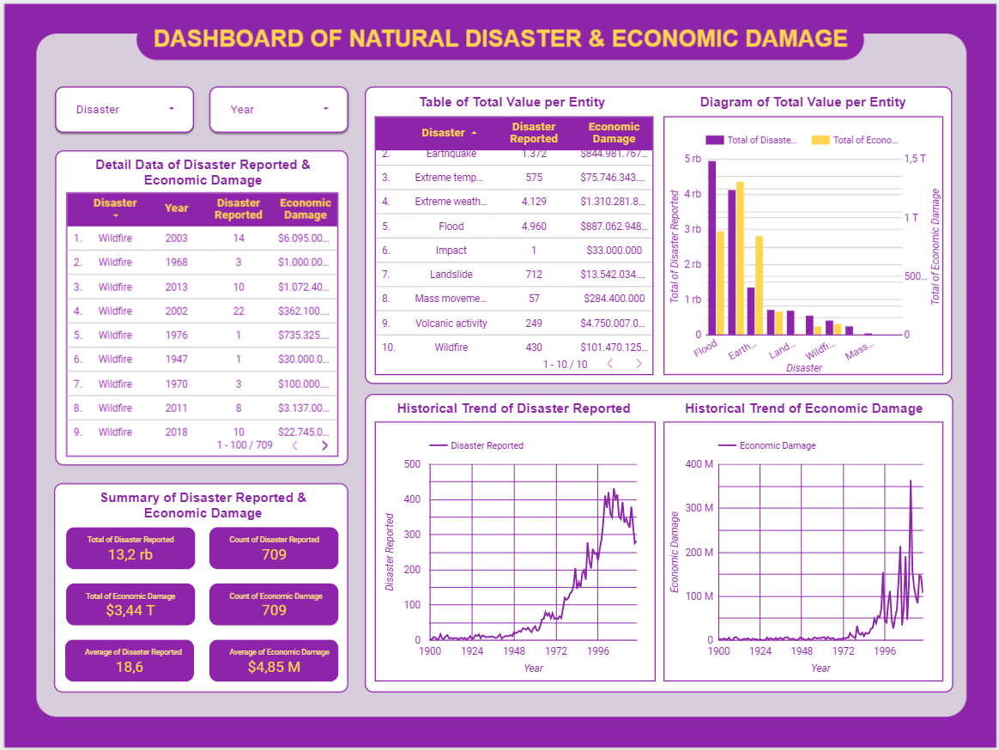

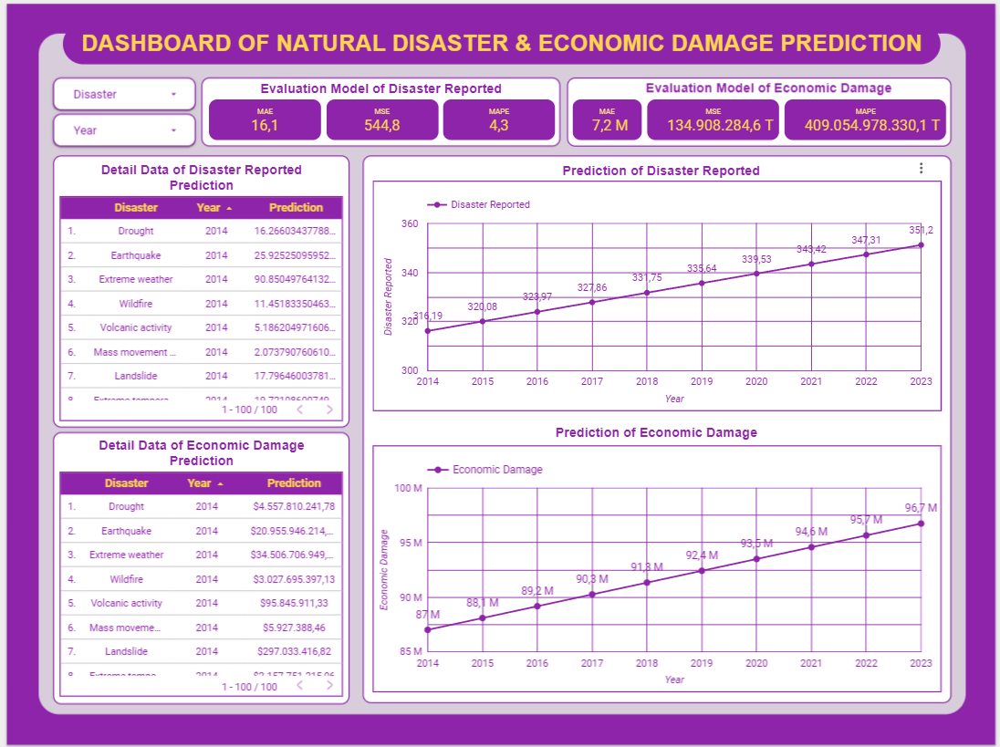

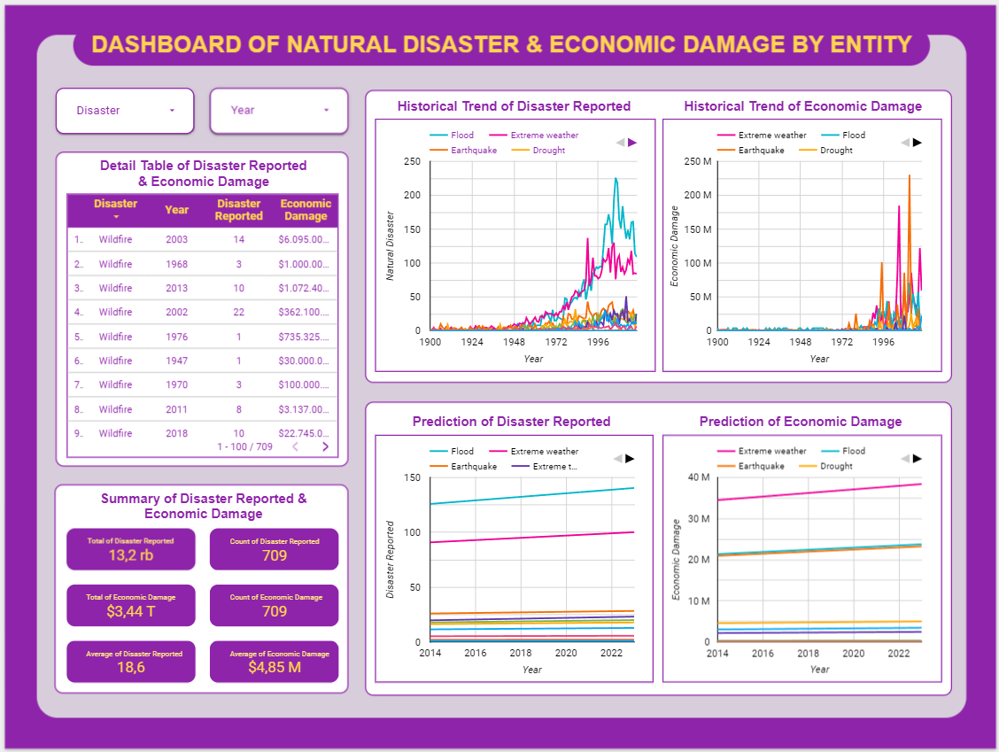

##**Part 4: Making Impact with Data Science**

Write a report (500-1000 words) on how the findings can contribute to societal change in the context of climate. Discuss potential strategies for mitigation and adaptation. Use additional data from valid reference if you will.


> https://docs.google.com/document/d/1w67qITn_tXNEcBHXok7n45aLqxub93hacVlj6hmNkZ8/edit

